In [18]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from transformers import AutoModelForTokenClassification, TrainingArguments, Trainer, AutoTokenizer, DataCollatorForTokenClassification
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP
import seaborn as sns
from tqdm import tqdm
import auxiliary as aux
from kingbert import KingBert
import os
from adjustText import adjust_text
from matplotlib import cm, colors
from matplotlib.lines import Line2D
import auxiliary as aux            

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using:", device)         

all_labels = ['B-STREET',
 'B-CITY',
 'I-DATE',
 'B-PASS',
 'I-CITY',
 'B-TIME',
 'B-EMAIL',
 'I-DRIVERLICENSE',
 'I-POSTCODE',
 'I-BOD',
 'B-USERNAME',
 'B-BOD',
 'B-COUNTRY',
 'B-SECADDRESS',
 'B-IDCARD',
 'I-SOCIALNUMBER',
 'I-PASSPORT',
 'B-IP',
 'O',
 'B-TEL',
 'B-SOCIALNUMBER',
 'I-TIME',
 'B-BUILDING',
 'B-PASSPORT',
 'I-TITLE',
 'I-SEX',
 'I-STREET',
 'B-STATE',
 'I-STATE',
 'B-TITLE',
 'B-DATE',
 'B-GEOCOORD',
 'I-IDCARD',
 'I-TEL',
 'B-POSTCODE',
 'B-DRIVERLICENSE',
 'I-GEOCOORD',
 'I-COUNTRY',
 'I-EMAIL',
 'I-PASS',
 'B-SEX',
 'I-USERNAME',
 'I-BUILDING',
 'I-IP',
 'I-SECADDRESS',
 'B-CARDISSUER',
 'I-CARDISSUER']
id2label = {i: l for i, l in enumerate(all_labels)}
label2id = {v: k for k, v in id2label.items()}
target = [l for l in all_labels if l != "O"]


Using: cuda:0


In [19]:
def extract_distilbert_embeddings(model, tokenizer, sentence):
    """Extract raw token embeddings from DistilBERT encoder before classification."""
    model.eval()

    # Tokenize input
    inputs = tokenizer.tokenize(sentence)
    input_ids = torch.tensor([[101] + tokenizer.convert_tokens_to_ids(inputs) + [102]])
    attention_mask = torch.tensor([1 for i in range(len(input_ids))]).unsqueeze(0)

    # Send to same device as model
    device = next(model.parameters()).device
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)

    # Get token-level embeddings from the encoder (before classifier)
    with torch.no_grad():
        outputs = model.distilbert(input_ids=input_ids, attention_mask=attention_mask)
        hidden_states = outputs.last_hidden_state  # shape: (1, seq_len, hidden_dim)

    return hidden_states.squeeze(0).cpu(), tokenizer.convert_ids_to_tokens(input_ids.squeeze(0).tolist())


def extract_albert_embeddings(model, tokenizer, sentence):
    """Extract raw token embeddings from AlBERT encoder before classification."""
    model.eval()

    # Tokenize input
    inputs = tokenizer.tokenize(sentence)
    input_ids = torch.tensor([[101] + tokenizer.convert_tokens_to_ids(inputs) + [102]])
    attention_mask = torch.tensor([1 for i in range(len(input_ids))]).unsqueeze(0)

    # Send to same device as model
    device = next(model.parameters()).device
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)

    # Get token-level embeddings from the encoder (before classifier)
    with torch.no_grad():
        outputs = model.albert(input_ids=input_ids, attention_mask=attention_mask)
        hidden_states = outputs.last_hidden_state  # shape: (1, seq_len, hidden_dim)

    return hidden_states.squeeze(0).cpu(), tokenizer.convert_ids_to_tokens(input_ids.squeeze(0).tolist())


def build_palette(labels):
    """
    Return dict: label_id -> hex colour.
    Uses 3 qualitative colormaps concatenated to get 60 different hues.
    """
    cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]
    big   = np.vstack([m(np.arange(20))[:, :3] for m in cmaps])  # (60,3) RGB
    return {i: colors.rgb2hex(big[i]) for i in range(len(labels))}


def visualize_embeddings_2d(
        embeddings,                 # (n_tokens, hidden)
        tokens,                     # list[str]
        token_labels,               # list[int]  same length, BIO id per token
        id2label,                   # dict[int->str]
        method="umap", figsize=(14, 10), dpi=100,
        palette=None,               # dict[label_id]->colour
        show_labels=False,          # text on each dot?
        use_adjusttext=False,       # ignored if show_labels False
        legend=True                 # show full legend?
    ):
    """
    Plot 2-D projection of token embeddings, coloured by BIO label.
    """

    assert len(embeddings) == len(tokens) == len(token_labels)

    # ---------------------------------------------------------------- 1. reduce
    if method == "pca":
        reducer = PCA(n_components=2, random_state=0)
    elif method == "tsne":
        reducer = TSNE(n_components=2, perplexity=5,
                       learning_rate=10, random_state=0)
    else:
        reducer = UMAP(n_neighbors=5, min_dist=.3, random_state=0)

    reduced = reducer.fit_transform(embeddings)
    xs, ys  = reduced[:, 0], reduced[:, 1]

    # ---------------------------------------------------------------- 2. colours
    if palette is None:
        palette = build_palette(id2label)      # 47 distinct hues
    colours = [palette[lbl] for lbl in token_labels]

    # ---------------------------------------------------------------- 3. draw
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.scatter(xs, ys, c=colours, s=30, alpha=.85)

    if show_labels:
        texts = [ax.text(x, y, t, fontsize=9)
                 for x, y, t in zip(xs, ys, tokens)]
        if use_adjusttext:
            from adjustText import adjust_text
            adjust_text(texts, arrowprops=dict(arrowstyle='-',
                                               color='grey', lw=.5))

    ax.set_title(f"Token Embeddings ({method.upper()})")
    ax.axis("off")

    # ---------------------------------------------------------------- 4. legend
    if legend:
        handles = []
        for lbl_id, colour in palette.items():
            if lbl_id in token_labels:             # keep legend short if you down-sampled
                handles.append(Line2D([0], [0], marker='o', ls='',
                                      markerfacecolor=colour,
                                      markeredgecolor='none',
                                      markersize=6,
                                      label=id2label[lbl_id]))
        # put legend outside right edge
        ax.legend(handles=handles, frameon=False,
                  bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)

    plt.tight_layout()
    plt.show()



def visualize_side_by_side(embeddings1, tokens1, labels1, id2label1, palette1,
                           embeddings2, tokens2, labels2, id2label2, palette2,
                           method="tsne", title1="True BIO", title2="Prediction Errors"):
    """
    Visualizes two sets of 2D-projected token embeddings side by side for comparison.

    Parameters:
    -----------
    embeddings1 : np.ndarray of shape (N, D)
        First set of token embeddings (e.g. colored by gold BIO labels).

    tokens1 : list of str
        Tokens corresponding to the first embedding set.

    labels1 : list of int
        Label IDs for each token in the first set.

    id2label1 : dict[int -> str]
        Mapping from label IDs to human-readable class names for the first plot.

    palette1 : dict[int -> str]
        Mapping from label IDs to hex color codes for the first plot.

    method : str, default="tsne"
        Dimensionality reduction method to use: one of {"tsne", "umap", "pca"}.
    """
    reducer = {
        "tsne": TSNE(n_components=2, random_state=0),
        "umap": UMAP(n_neighbors=10, min_dist=0.1, metric='cosine', random_state=0),
        "pca": PCA(n_components=2, random_state=0)
    }[method]

    fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    reduced1 = reducer.fit_transform(embeddings1)
    reduced2 = reducer.fit_transform(embeddings2)

    for ax, reduced, tokens, labels, id2label, palette, title in zip(
        axs,
        [reduced1, reduced2],
        [tokens1, tokens2],
        [labels1, labels2],
        [id2label1, id2label2],
        [palette1, palette2],
        [title1, title2]
    ):
        xs, ys = reduced[:, 0], reduced[:, 1]
        colours = [palette[label] for label in labels]
        ax.scatter(xs, ys, c=colours, s=8, alpha=0.75)

        handles = [
            Line2D([0], [0], marker='o', color='w', label=id2label[i],
                   markerfacecolor=palette[i], markersize=6)
            for i in sorted(set(labels))
        ]
        ax.legend(
            handles=handles,
            loc='center left',
            bbox_to_anchor=(1.05, 0.5),
            borderaxespad=0.,
            fontsize='small',
            frameon=False
        )
        ax.set_title(f"{title} ({method.upper()})")
        ax.axis("off")

    plt.subplots_adjust(right=0.78)
    plt.show()


In [21]:
test_sentence = "My username is Samu_mancio and my credit card is 5246-4327-8002-6766."

distilbert1 = AutoModelForTokenClassification.from_pretrained('models/distilbert1')
tokenizer_distilbert1  = AutoTokenizer.from_pretrained('models/distilbert1')

albert1 = AutoModelForTokenClassification.from_pretrained('models/albert1')
tokenizer_albert1  = AutoTokenizer.from_pretrained('models/albert1')

distilbert1_adv = AutoModelForTokenClassification.from_pretrained('models/distilbert1_adv')
tokenizer_distilbert1_adv  = AutoTokenizer.from_pretrained('models/distilbert1_adv')

albert1_adv = AutoModelForTokenClassification.from_pretrained('models/albert1_adv')
tokenizer_albert1_adv  = AutoTokenizer.from_pretrained('models/albert1_adv')

# Distilbert1

C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


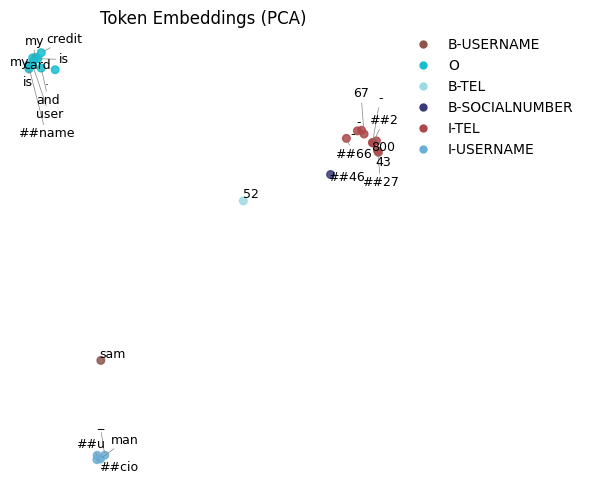

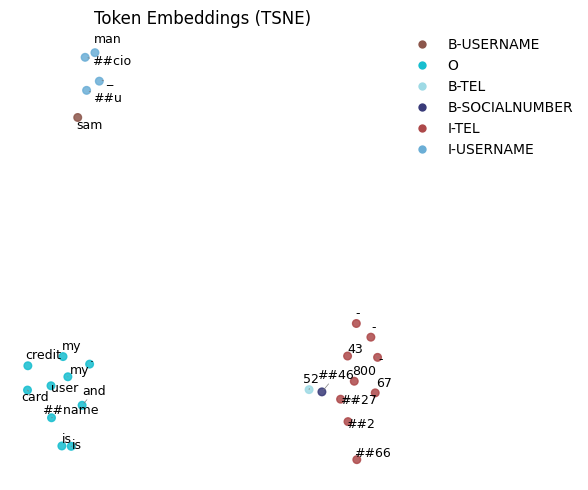

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


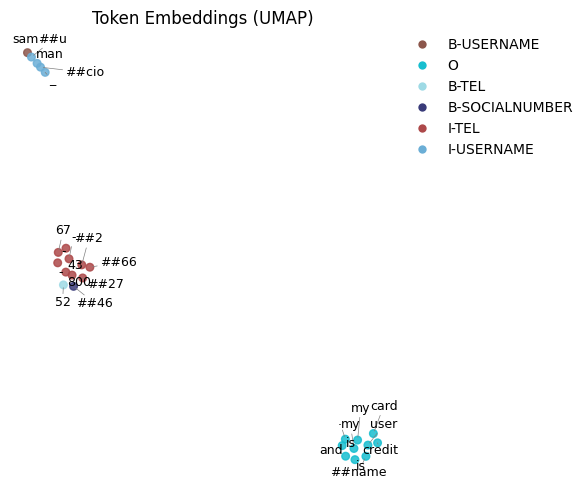

In [22]:
# ---------------------- 1. Extract Token Embeddings (no special tokens) ----------------------
hidden_states, tokens = extract_distilbert_embeddings(distilbert1, tokenizer_distilbert1, test_sentence)

special = {tokenizer_distilbert1.cls_token, tokenizer_distilbert1.sep_token, tokenizer_distilbert1.pad_token}
filtered_tok, filtered_emb = [], []

for i, tok in enumerate(tokens):
    if tok not in special:
        filtered_tok.append(tok)
        filtered_emb.append(hidden_states[i].numpy())  # already on CPU from extract_albert_embeddings

# ---------------------- 2. Predict Labels -----------------------------------------------------
inputs = tokenizer_distilbert1(test_sentence, return_tensors="pt").to(distilbert1.device)

with torch.no_grad():
    logits = distilbert1(**inputs).logits
    preds = logits.argmax(-1).squeeze(0).tolist()

# Align prediction indices with filtered tokens
filtered_lbl = [
    preds[i] for i, tok in enumerate(tokens) if tok not in special
]

# ---------------------- 3. Visualize in 2D ----------------------------------------------------
palette = build_palette(aux.id2label)

for method in ["pca", "tsne", "umap"]:
    visualize_embeddings_2d(
        embeddings     = np.vstack(filtered_emb),
        tokens         = filtered_tok,
        token_labels   = filtered_lbl,
        id2label       = aux.id2label,
        palette        = palette,
        method         = method,
        show_labels    = True,
        use_adjusttext = True,
        legend         = True,
        figsize=(6, 5)
    )


In [56]:
train_json = "data/distilbert_train.json"        
test_json = "data/distilbert_test.json"        
test_adv_json = "data/distilbert_test_adv.json"        
train_dataset    = aux.json_to_Dataset(train_json)
test_dataset    = aux.json_to_Dataset(test_json)
test_dataset_adv    = aux.json_to_Dataset_adv(test_adv_json)

model_name = "models/distilbert1"
model      = AutoModelForTokenClassification.from_pretrained(model_name).to(device).eval()
tokenizer  = AutoTokenizer.from_pretrained(model_name)

print("Train dataset len:", len(train_dataset))
print("Test dataset len:", len(test_dataset))
print("Test Advversarial dataset len:", len(test_dataset_adv))

Train dataset len: 18651
Test dataset len: 2320
Test Advversarial dataset len: 962


### Train Dataset

In [24]:
# --- Config ---
MAX_POINTS = 10000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
train_all_emb, train_all_tok, train_flat_gold, train_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(train_loader, desc="Train_Embedding + Train_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.distilbert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                train_all_tok.append(tok)
                train_all_emb.append(h[i, j])
                train_flat_gold.append(labels[j])
                train_flat_pred.append(pred_row[j])

Train_Embedding + Train_Prediction:   0%|          | 0/583 [00:00<?, ?it/s]

You're using a DistilBertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
Train_Embedding + Train_Prediction: 100%|██████████| 583/583 [02:46<00:00,  3.50it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


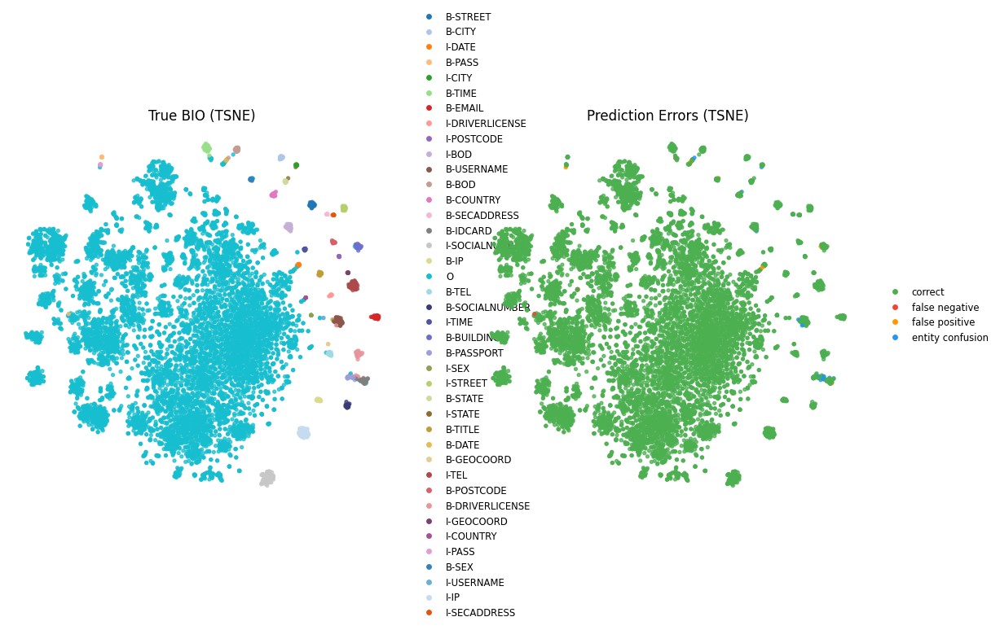

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


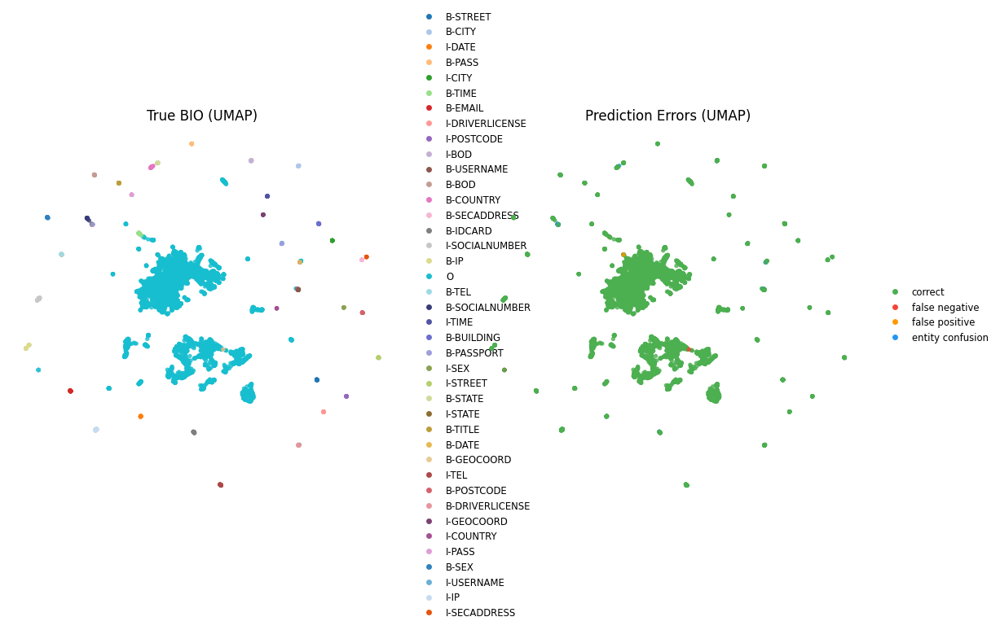

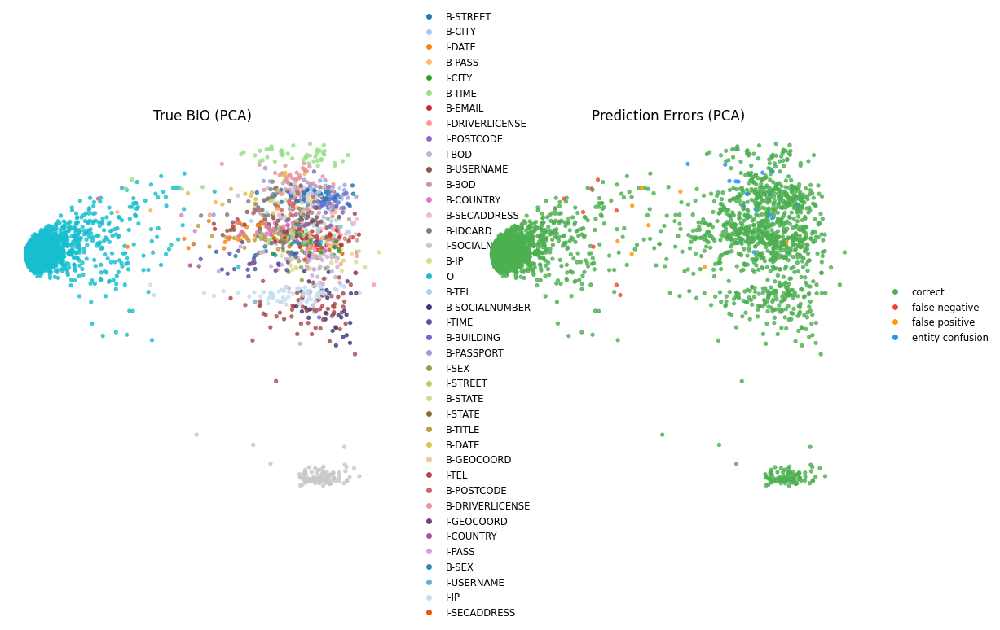

In [25]:
# --- Downsample for TSNE/UMAP ---
if len(train_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(train_all_emb), MAX_POINTS, replace=False)
    train_all_emb = np.array(train_all_emb)[keep]
    train_all_tok = [train_all_tok[i] for i in keep]
    train_flat_gold = [train_flat_gold[i] for i in keep]
    train_flat_pred = [train_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(train_flat_gold, train_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(train_all_emb),
        tokens1=train_all_tok,
        labels1=train_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(train_all_emb),
        tokens2=train_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [26]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report Distilbert1 (Train Set)\n")
print(classification_report(
    train_flat_gold,
    train_flat_pred,
    target_names=[id2label[i] for i in sorted(set(train_flat_gold + train_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report Distilbert1 (Train Set)

                 precision    recall  f1-score   support

       B-STREET      1.000     1.000     1.000        39
         B-CITY      1.000     1.000     1.000        30
         I-DATE      0.920     0.958     0.939        24
         B-PASS      1.000     0.941     0.970        17
         I-CITY      0.950     1.000     0.974        19
         B-TIME      1.000     0.960     0.980        50
        B-EMAIL      1.000     1.000     1.000        40
I-DRIVERLICENSE      1.000     1.000     1.000        19
     I-POSTCODE      1.000     1.000     1.000        14
          I-BOD      1.000     0.977     0.988        43
     B-USERNAME      0.967     1.000     0.983        59
          B-BOD      1.000     0.971     0.986        35
      B-COUNTRY      1.000     0.968     0.984        31
   B-SECADDRESS      1.000     1.000     1.000        14
       B-IDCARD      0.864     0.905     0.884        42
 I-SOCIALNUMBER      1.000     1.0

### Test Dataset

In [27]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb, test_all_tok, test_flat_gold, test_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.distilbert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok.append(tok)
                test_all_emb.append(h[i, j])
                test_flat_gold.append(labels[j])
                test_flat_pred.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 73/73 [00:22<00:00,  3.27it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


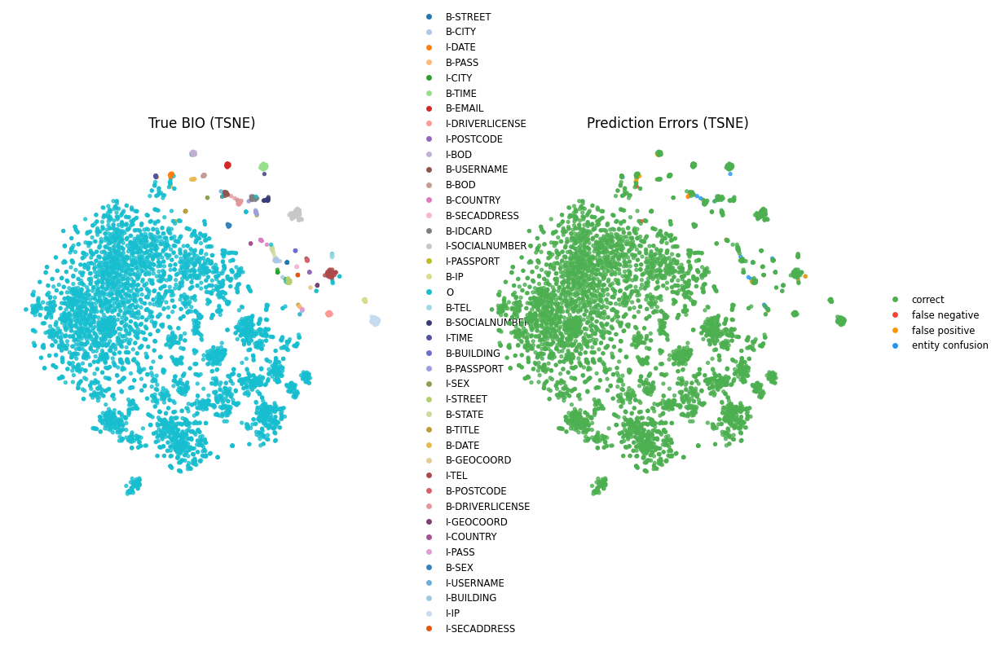

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


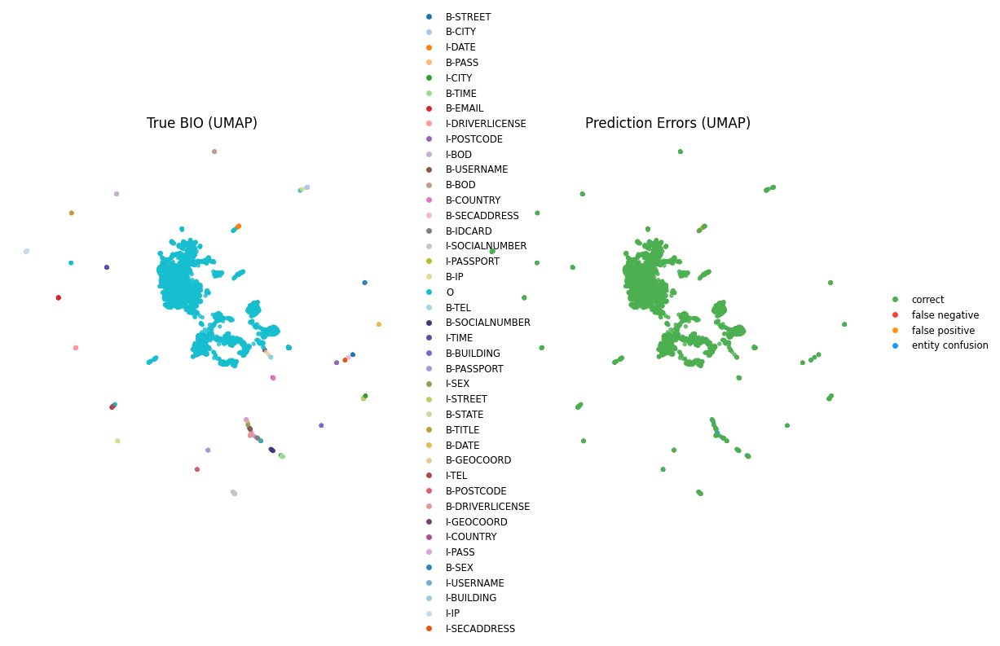

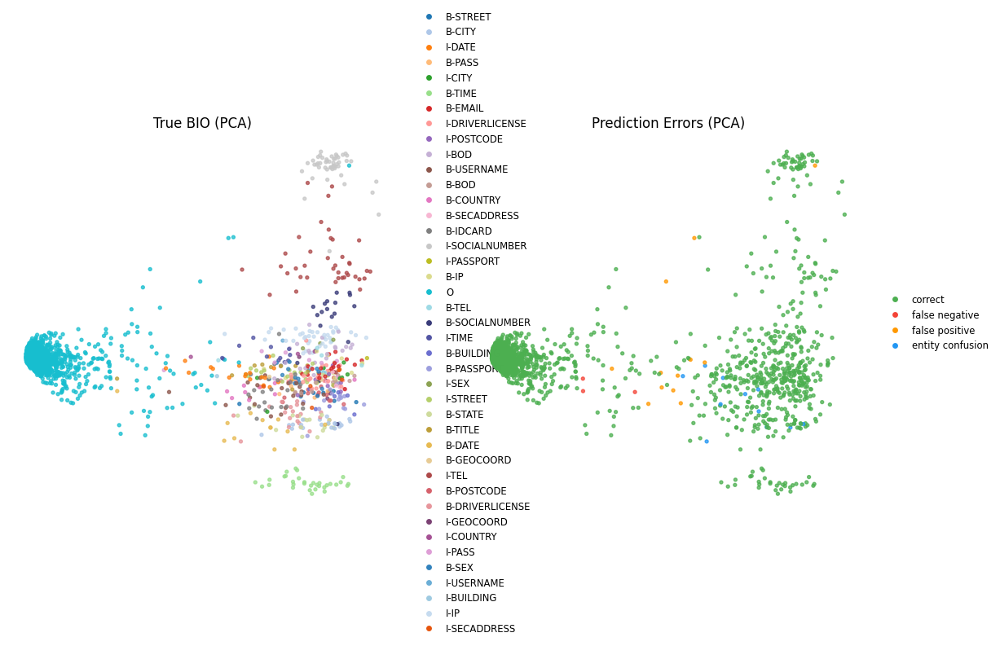

In [29]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb), MAX_POINTS, replace=False)
    test_all_emb = np.array(test_all_emb)[keep]
    test_all_tok = [test_all_tok[i] for i in keep]
    test_flat_gold = [test_flat_gold[i] for i in keep]
    test_flat_pred = [test_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold, test_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb),
        tokens1=test_all_tok,
        labels1=test_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb),
        tokens2=test_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [30]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold,
    test_flat_pred,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold + test_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report (Test Set)

                 precision    recall  f1-score   support

       B-STREET      1.000     1.000     1.000         8
         B-CITY      0.952     1.000     0.976        20
         I-DATE      0.905     0.950     0.927        20
         B-PASS      0.750     0.750     0.750         4
         I-CITY      0.857     0.857     0.857         7
         B-TIME      0.970     1.000     0.985        32
        B-EMAIL      1.000     1.000     1.000        22
I-DRIVERLICENSE      1.000     1.000     1.000        23
     I-POSTCODE      1.000     1.000     1.000         7
          I-BOD      0.957     1.000     0.978        22
     B-USERNAME      0.818     0.900     0.857        20
          B-BOD      1.000     1.000     1.000        14
      B-COUNTRY      0.917     1.000     0.957        11
   B-SECADDRESS      1.000     1.000     1.000         5
       B-IDCARD      0.958     1.000     0.979        23
 I-SOCIALNUMBER      0.980     1.000     0.990 

### Test Dataset Adversarial

In [57]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_adv_loader = DataLoader(
    test_dataset_adv,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb_adv, test_all_tok_adv, test_flat_gold_adv, test_flat_pred_adv = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_adv_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.distilbert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok_adv.append(tok)
                test_all_emb_adv.append(h[i, j])
                test_flat_gold_adv.append(labels[j])
                test_flat_pred_adv.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


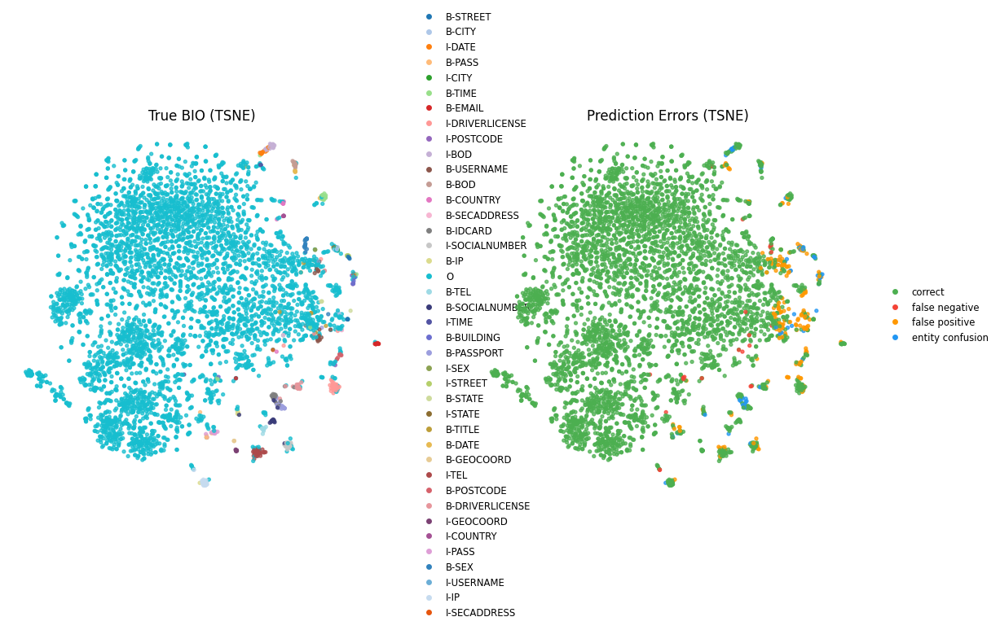

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


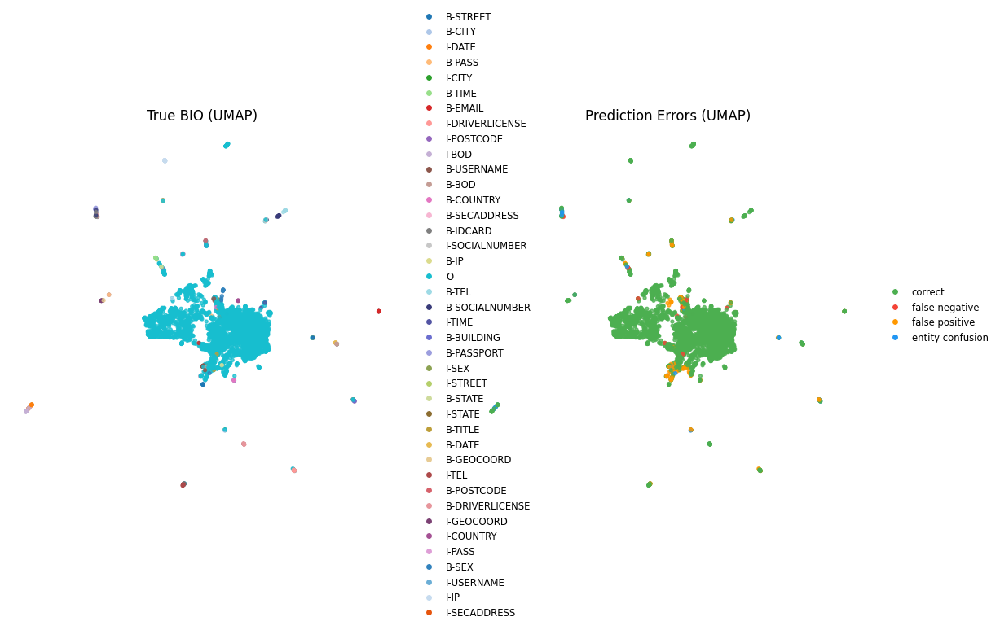

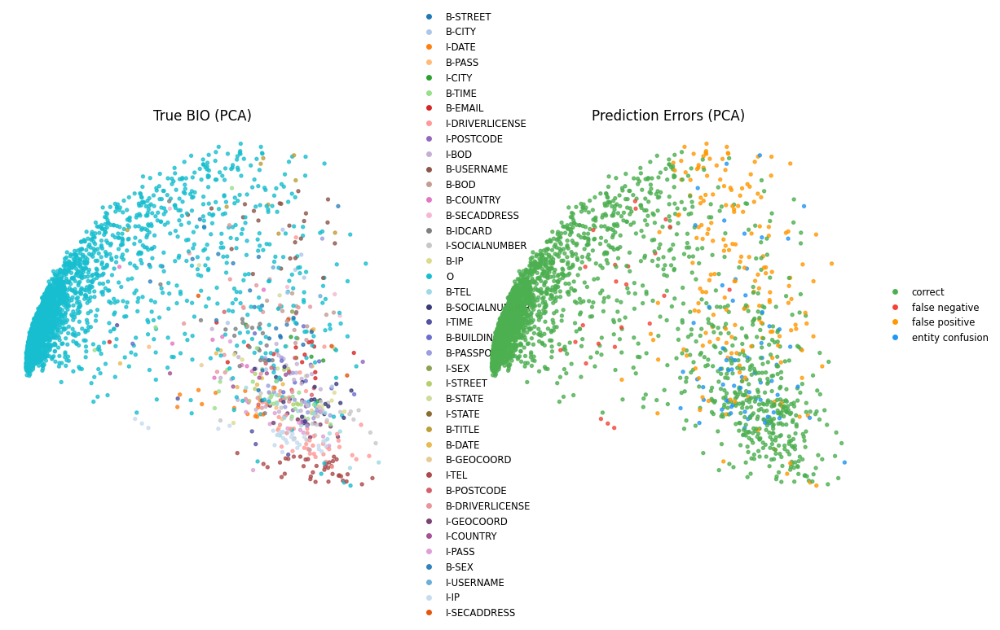

In [58]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb_adv) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb_adv), MAX_POINTS, replace=False)
    test_all_emb_adv = np.array(test_all_emb_adv)[keep]
    test_all_tok_adv = [test_all_tok_adv[i] for i in keep]
    test_flat_gold_adv = [test_flat_gold_adv[i] for i in keep]
    test_flat_pred_adv = [test_flat_pred_adv[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold_adv, test_flat_pred_adv):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb_adv),
        tokens1=test_all_tok_adv,
        labels1=test_flat_gold_adv,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb_adv),
        tokens2=test_all_tok_adv,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [59]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold_adv,
    test_flat_pred_adv,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold_adv + test_flat_pred_adv))],
    zero_division=0,
    digits=3
))

Token Classification Report (Test Set)

                 precision    recall  f1-score   support

       B-STREET      0.750     0.667     0.706         9
         B-CITY      0.227     0.625     0.333         8
         I-DATE      0.600     0.800     0.686        15
         B-PASS      0.714     0.556     0.625         9
         I-CITY      0.294     1.000     0.455         5
         B-TIME      0.793     0.821     0.807        28
        B-EMAIL      0.867     0.929     0.897        14
I-DRIVERLICENSE      0.804     0.902     0.851        41
     I-POSTCODE      0.417     1.000     0.588         5
          I-BOD      0.864     0.760     0.809        25
     B-USERNAME      0.429     0.913     0.583        23
          B-BOD      0.867     0.867     0.867        15
      B-COUNTRY      0.667     0.800     0.727        10
   B-SECADDRESS      0.200     0.750     0.316         4
       B-IDCARD      0.690     0.800     0.741        25
 I-SOCIALNUMBER      0.788     1.000     0.881 

# Albert1

C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


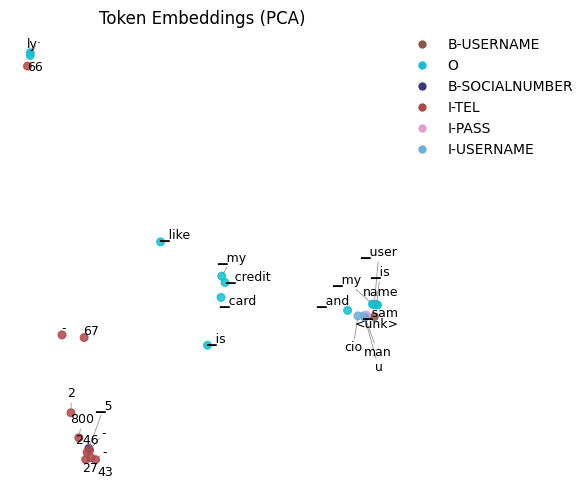

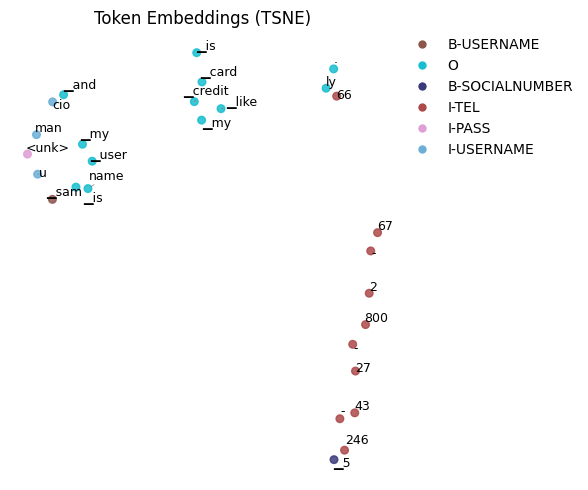

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


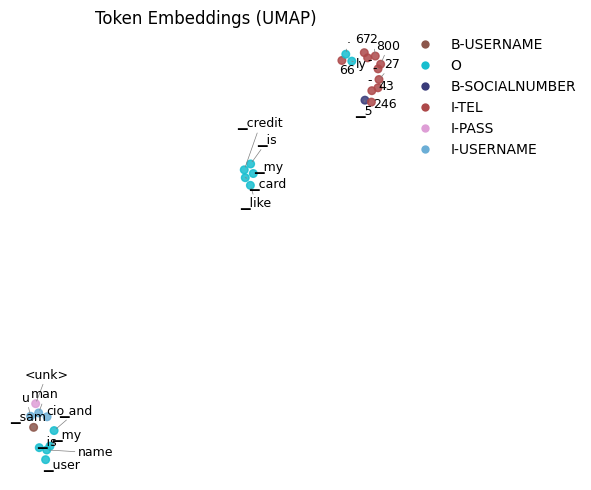

In [31]:
# ---------------------- 1. Extract Token Embeddings (no special tokens) ----------------------
hidden_states, tokens = extract_albert_embeddings(albert1, tokenizer_albert1, test_sentence)

special = {tokenizer_albert1.cls_token, tokenizer_albert1.sep_token, tokenizer_albert1.pad_token}
filtered_tok, filtered_emb = [], []

for i, tok in enumerate(tokens):
    if tok not in special:
        filtered_tok.append(tok)
        filtered_emb.append(hidden_states[i].numpy())  # already on CPU from extract_albert_embeddings

# ---------------------- 2. Predict Labels -----------------------------------------------------
inputs = tokenizer_albert1(test_sentence, return_tensors="pt").to(albert1.device)

with torch.no_grad():
    logits = albert1(**inputs).logits
    preds = logits.argmax(-1).squeeze(0).tolist()

# Align prediction indices with filtered tokens
filtered_lbl = [
    preds[i] for i, tok in enumerate(tokens) if tok not in special
]

# ---------------------- 3. Visualize in 2D ----------------------------------------------------
palette = build_palette(aux.id2label)

for method in ["pca", "tsne", "umap"]:
    visualize_embeddings_2d(
        embeddings     = np.vstack(filtered_emb),
        tokens         = filtered_tok,
        token_labels   = filtered_lbl,
        id2label       = aux.id2label,
        palette        = palette,
        method         = method,
        show_labels    = True,
        use_adjusttext = True,
        legend         = True,
        figsize=(6, 5)
    )


In [61]:
train_json = "data/albert_train.json"        
test_json = "data/albert_test.json"
test_json_adv = "data/albert_test_adv.json"
train_dataset    = aux.json_to_Dataset(train_json)
test_dataset    = aux.json_to_Dataset(test_json)
test_dataset_adv    = aux.json_to_Dataset_adv(test_json_adv)

model_name = "models/albert1"
model      = AutoModelForTokenClassification.from_pretrained(model_name).to(device).eval()
tokenizer  = AutoTokenizer.from_pretrained(model_name)

print("Train dataset len:", len(train_dataset))
print("Test dataset len:", len(test_dataset))
print("Test Adversarial dataset len:", len(test_dataset_adv))

Train dataset len: 18651
Test dataset len: 2320
Test Adversarial dataset len: 962


### Train dataset

In [33]:
# --- Config ---
MAX_POINTS = 10000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
train_all_emb, train_all_tok, train_flat_gold, train_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(train_loader, desc="Train_Embedding + Train_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.albert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                train_all_tok.append(tok)
                train_all_emb.append(h[i, j])
                train_flat_gold.append(labels[j])
                train_flat_pred.append(pred_row[j])

Train_Embedding + Train_Prediction: 100%|██████████| 583/583 [09:08<00:00,  1.06it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


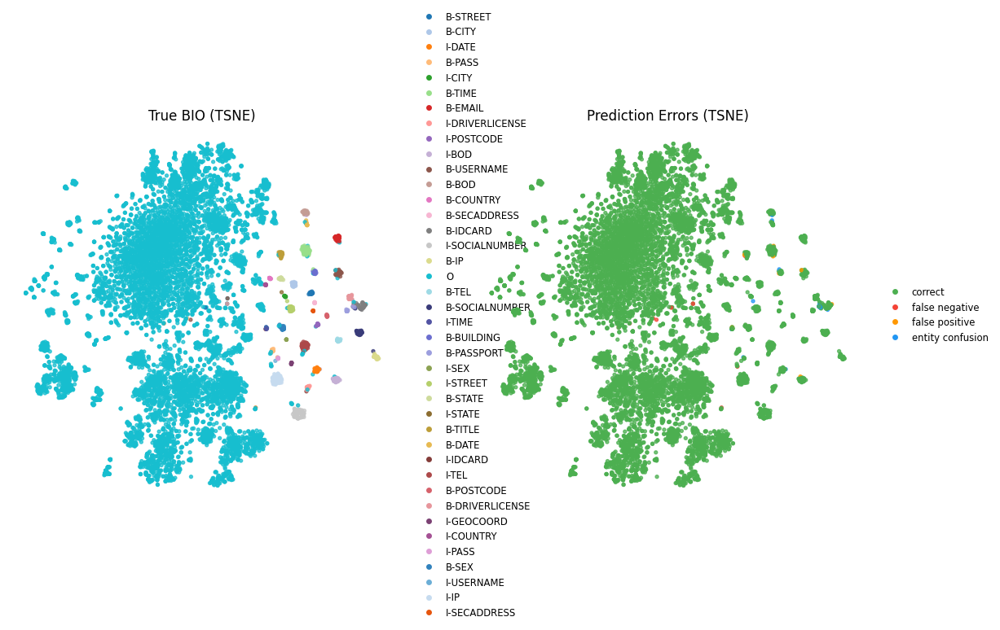

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


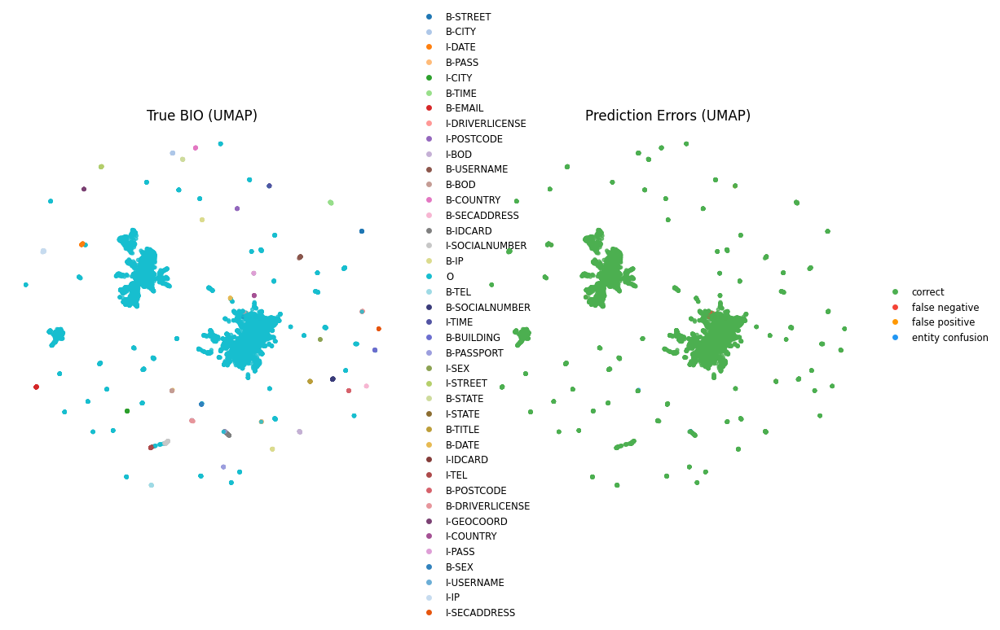

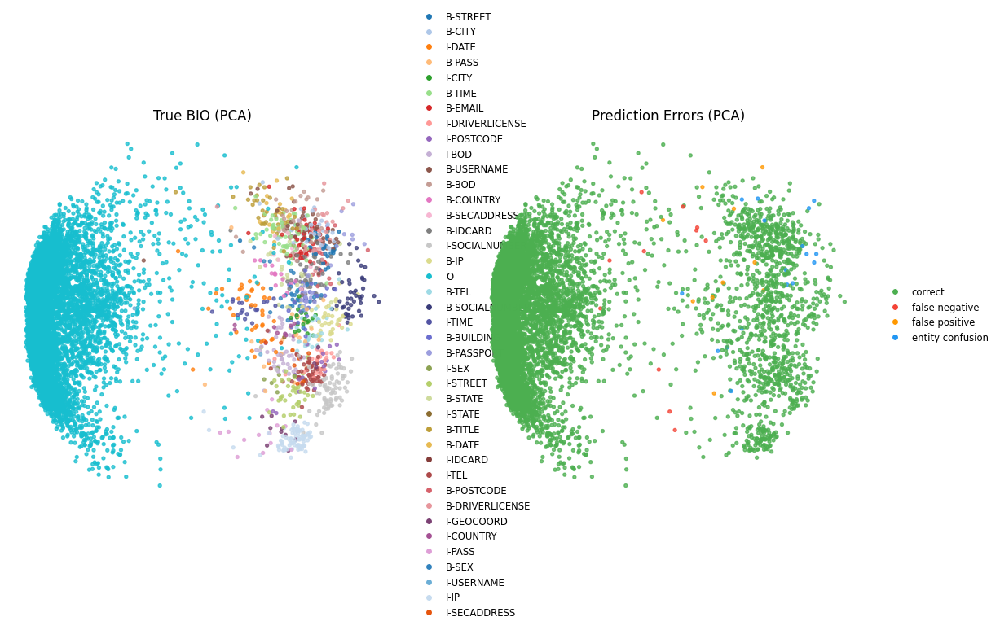

In [34]:
# --- Downsample for TSNE/UMAP ---
if len(train_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(train_all_emb), MAX_POINTS, replace=False)
    train_all_emb = np.array(train_all_emb)[keep]
    train_all_tok = [train_all_tok[i] for i in keep]
    train_flat_gold = [train_flat_gold[i] for i in keep]
    train_flat_pred = [train_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(train_flat_gold, train_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(train_all_emb),
        tokens1=train_all_tok,
        labels1=train_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(train_all_emb),
        tokens2=train_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [35]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Train Set)\n")
print(classification_report(
    train_flat_gold,
    train_flat_pred,
    target_names=[id2label[i] for i in sorted(set(train_flat_gold + train_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report (Train Set)

                 precision    recall  f1-score   support

       B-STREET      1.000     0.966     0.982        29
         B-CITY      1.000     1.000     1.000        35
         I-DATE      0.973     0.900     0.935        40
         B-PASS      1.000     0.917     0.957        24
         I-CITY      0.947     1.000     0.973        18
         B-TIME      0.970     0.985     0.977        65
        B-EMAIL      1.000     1.000     1.000        43
I-DRIVERLICENSE      1.000     1.000     1.000        27
     I-POSTCODE      1.000     1.000     1.000        17
          I-BOD      0.978     0.957     0.967        46
     B-USERNAME      0.957     0.978     0.968        46
          B-BOD      0.947     0.973     0.960        37
      B-COUNTRY      1.000     1.000     1.000        17
   B-SECADDRESS      1.000     1.000     1.000        11
       B-IDCARD      0.956     0.896     0.925        48
 I-SOCIALNUMBER      1.000     1.000     1.000

### Test Dataset

In [36]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb, test_all_tok, test_flat_gold, test_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.albert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok.append(tok)
                test_all_emb.append(h[i, j])
                test_flat_gold.append(labels[j])
                test_flat_pred.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 73/73 [01:09<00:00,  1.05it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


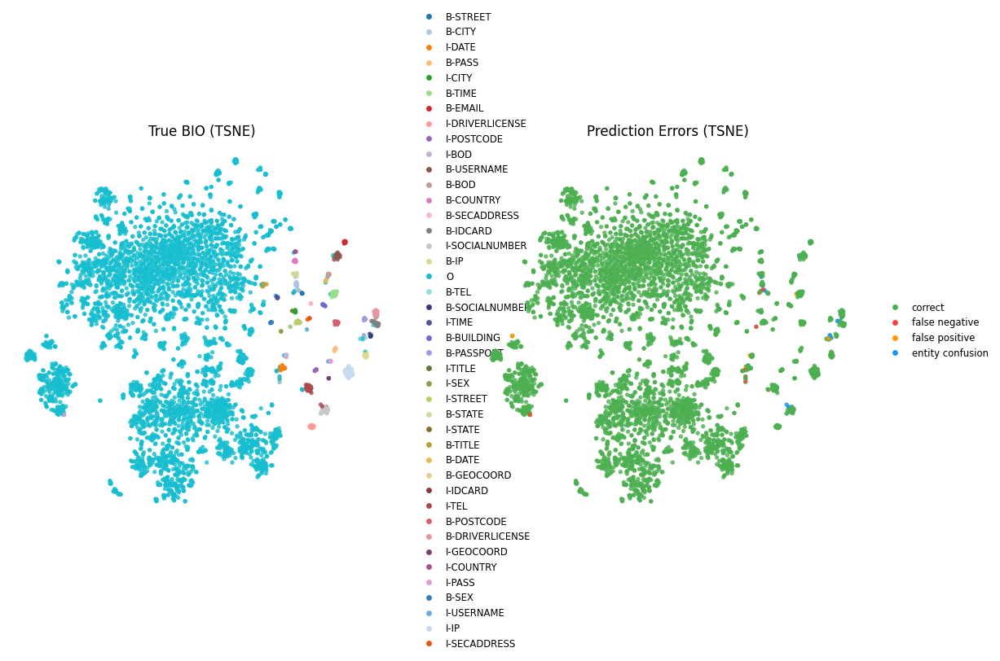

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


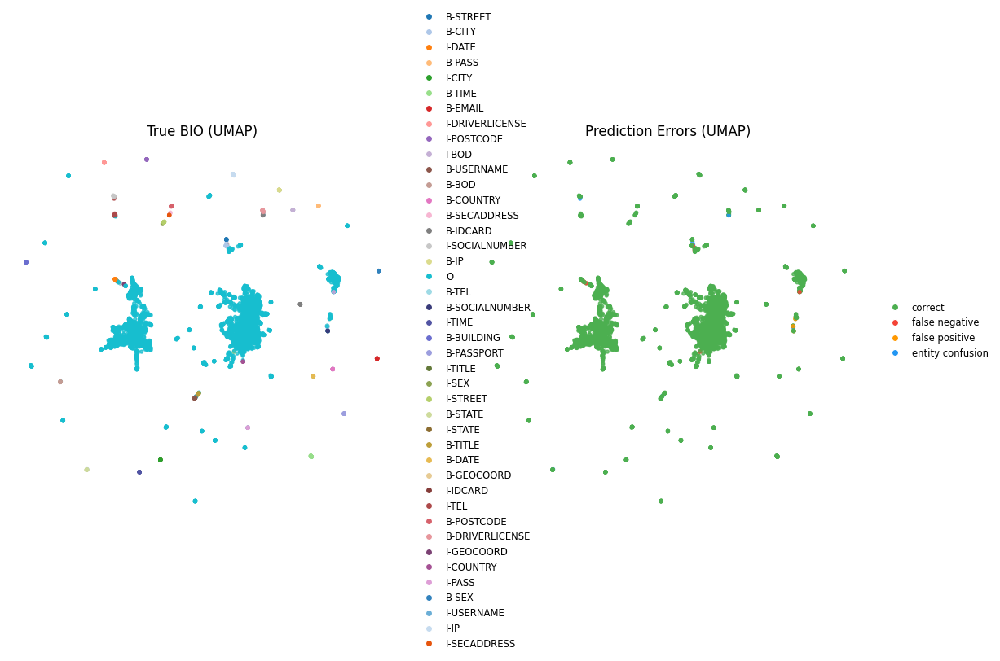

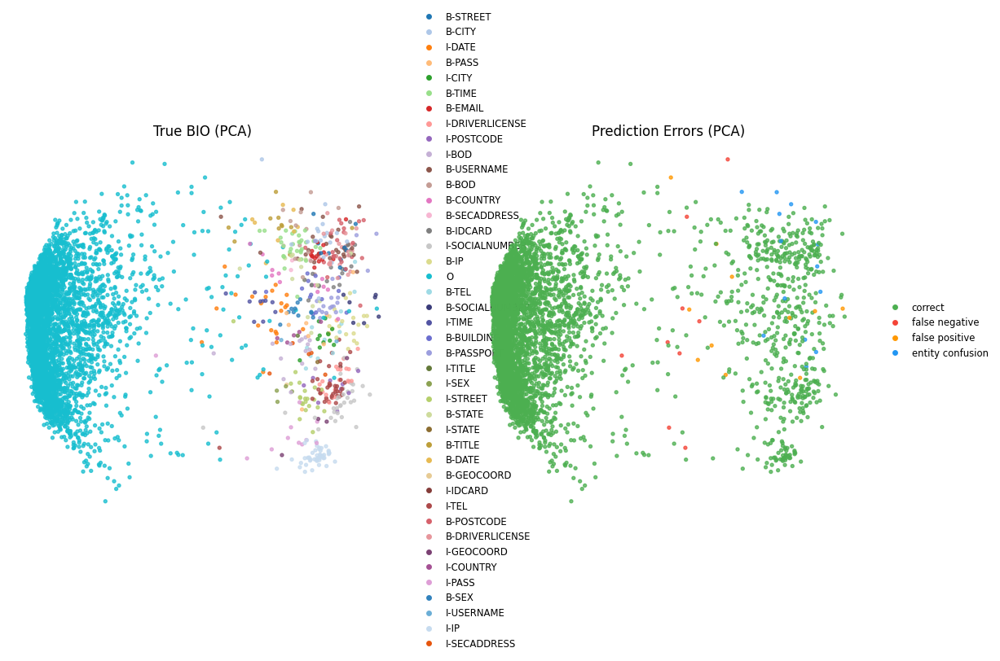

In [37]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb), MAX_POINTS, replace=False)
    test_all_emb = np.array(test_all_emb)[keep]
    test_all_tok = [test_all_tok[i] for i in keep]
    test_flat_gold = [test_flat_gold[i] for i in keep]
    test_flat_pred = [test_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold, test_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb),
        tokens1=test_all_tok,
        labels1=test_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb),
        tokens2=test_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [38]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold,
    test_flat_pred,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold + test_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report (Test Set)

                 precision    recall  f1-score   support

       B-STREET      0.900     0.900     0.900        10
         B-CITY      0.875     0.824     0.848        17
         I-DATE      0.950     0.905     0.927        21
         B-PASS      1.000     1.000     1.000        10
         I-CITY      1.000     1.000     1.000        12
         B-TIME      0.968     1.000     0.984        30
        B-EMAIL      1.000     1.000     1.000        15
I-DRIVERLICENSE      1.000     1.000     1.000        19
     I-POSTCODE      1.000     1.000     1.000         9
          I-BOD      0.933     0.933     0.933        15
     B-USERNAME      0.963     0.963     0.963        27
          B-BOD      1.000     0.923     0.960        13
      B-COUNTRY      0.923     1.000     0.960        12
   B-SECADDRESS      1.000     1.000     1.000         4
       B-IDCARD      0.944     0.895     0.919        19
 I-SOCIALNUMBER      0.886     0.969     0.925 

### Test Dataset Adversarial

In [64]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_adv_loader = DataLoader(
    test_dataset_adv,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb_adv, test_all_tok_adv, test_flat_gold_adv, test_flat_pred_adv = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_adv_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.albert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok_adv.append(tok)
                test_all_emb_adv.append(h[i, j])
                test_flat_gold_adv.append(labels[j])
                test_flat_pred_adv.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 31/31 [00:33<00:00,  1.08s/it]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


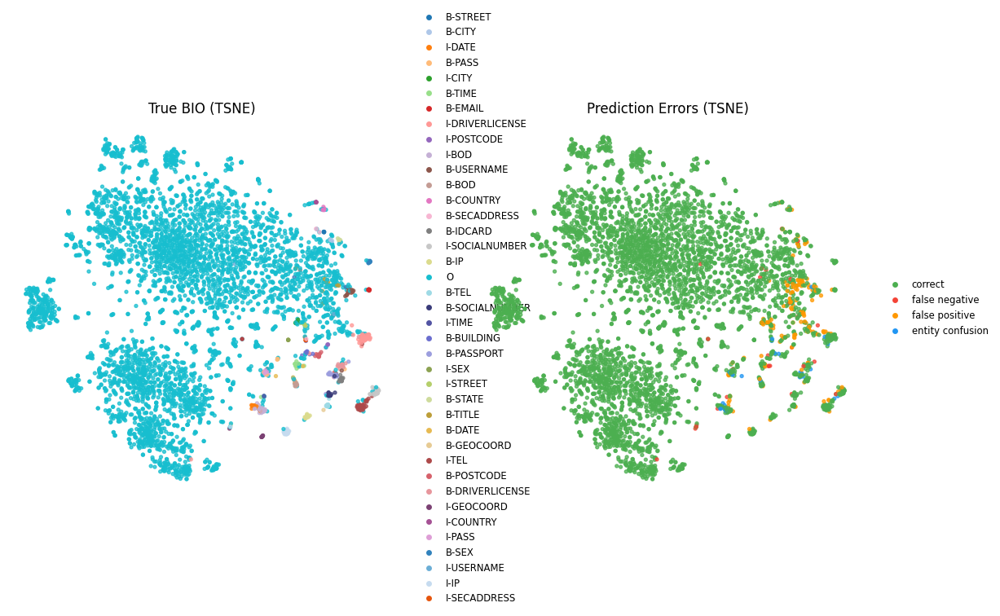

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


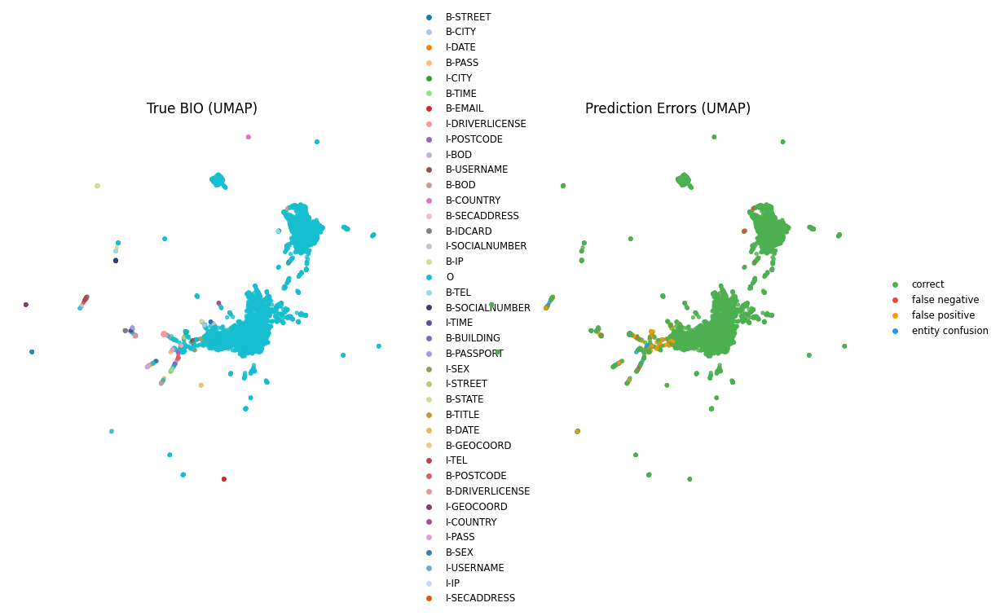

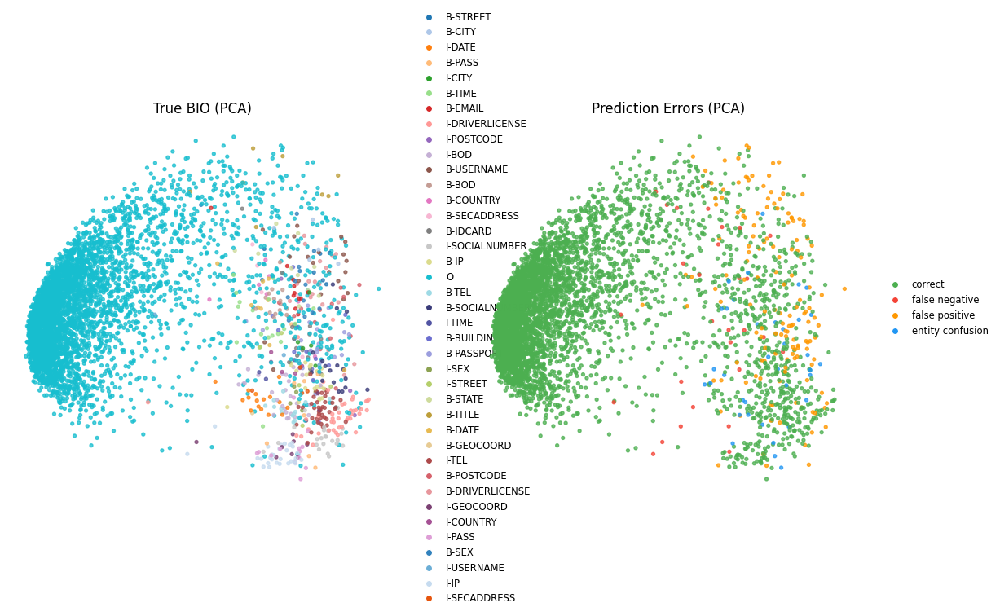

In [65]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb_adv) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb_adv), MAX_POINTS, replace=False)
    test_all_emb_adv = np.array(test_all_emb_adv)[keep]
    test_all_tok_adv = [test_all_tok_adv[i] for i in keep]
    test_flat_gold_adv = [test_flat_gold_adv[i] for i in keep]
    test_flat_pred_adv = [test_flat_pred_adv[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold_adv, test_flat_pred_adv):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb_adv),
        tokens1=test_all_tok_adv,
        labels1=test_flat_gold_adv,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb_adv),
        tokens2=test_all_tok_adv,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [66]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold_adv,
    test_flat_pred_adv,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold_adv + test_flat_pred_adv))],
    zero_division=0,
    digits=3
))

Token Classification Report (Test Set)

                 precision    recall  f1-score   support

       B-STREET      1.000     1.000     1.000         6
         B-CITY      0.571     0.800     0.667         5
         I-DATE      0.619     0.812     0.703        16
         B-PASS      0.667     0.500     0.571         8
         I-CITY      0.417     1.000     0.588         5
         B-TIME      0.773     0.850     0.810        20
        B-EMAIL      0.917     0.917     0.917        12
I-DRIVERLICENSE      0.759     0.932     0.837        44
     I-POSTCODE      0.250     0.750     0.375         4
          I-BOD      0.833     0.741     0.784        27
     B-USERNAME      0.486     0.900     0.632        20
          B-BOD      0.875     0.933     0.903        15
      B-COUNTRY      0.700     1.000     0.824         7
   B-SECADDRESS      0.750     0.600     0.667         5
       B-IDCARD      0.833     0.882     0.857        17
 I-SOCIALNUMBER      0.774     0.960     0.857 

# Distilbert_adv

C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


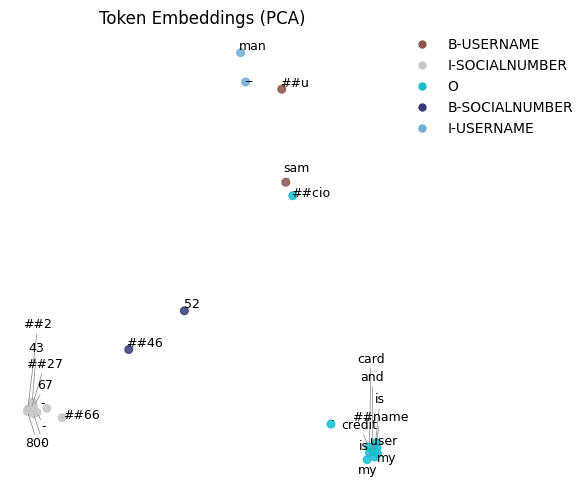

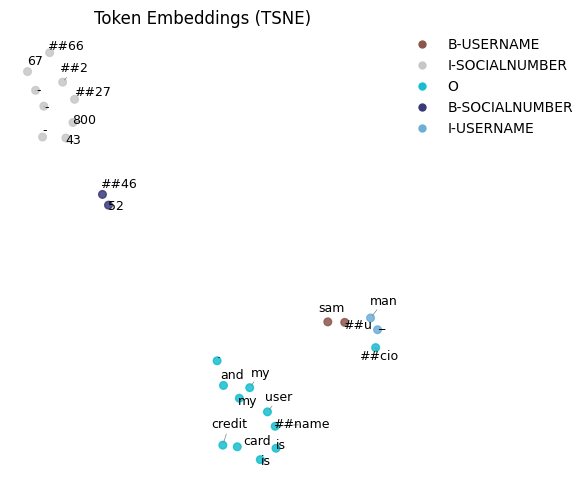

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


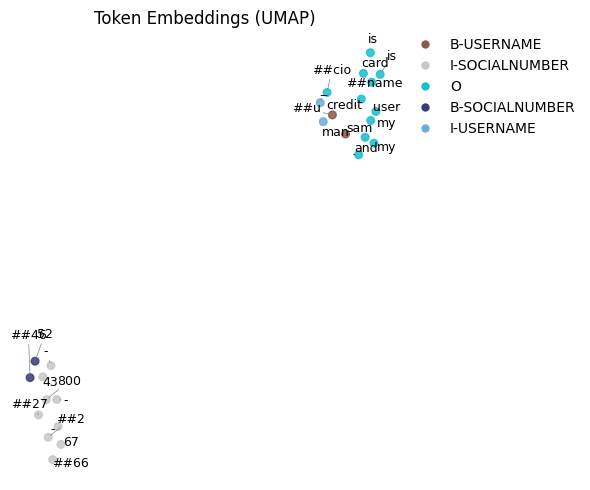

In [39]:
# ---------------------- 1. Extract Token Embeddings (no special tokens) ----------------------
hidden_states, tokens = extract_distilbert_embeddings(distilbert1_adv, tokenizer_distilbert1_adv, test_sentence)

special = {tokenizer_distilbert1_adv.cls_token, tokenizer_distilbert1_adv.sep_token, tokenizer_distilbert1_adv.pad_token}
filtered_tok, filtered_emb = [], []

for i, tok in enumerate(tokens):
    if tok not in special:
        filtered_tok.append(tok)
        filtered_emb.append(hidden_states[i].numpy())  # already on CPU from extract_albert_embeddings

# ---------------------- 2. Predict Labels -----------------------------------------------------
inputs = tokenizer_distilbert1_adv(test_sentence, return_tensors="pt").to(distilbert1_adv.device)

with torch.no_grad():
    logits = distilbert1_adv(**inputs).logits
    preds = logits.argmax(-1).squeeze(0).tolist()

# Align prediction indices with filtered tokens
filtered_lbl = [
    preds[i] for i, tok in enumerate(tokens) if tok not in special
]

# ---------------------- 3. Visualize in 2D ----------------------------------------------------
palette = build_palette(aux.id2label)

for method in ["pca", "tsne", "umap"]:
    visualize_embeddings_2d(
        embeddings     = np.vstack(filtered_emb),
        tokens         = filtered_tok,
        token_labels   = filtered_lbl,
        id2label       = aux.id2label,
        palette        = palette,
        method         = method,
        show_labels    = True,
        use_adjusttext = True,
        legend         = True,
        figsize=(6, 5)
    )


In [41]:
train_json = "data/distilbert_train_adv.json"        
test_json = "data/distilbert_test_adv.json"          
train_dataset    = aux.json_to_Dataset_adv(train_json)
test_dataset    = aux.json_to_Dataset_adv(test_json)

model_name = "models/distilbert1_adv"
model      = AutoModelForTokenClassification.from_pretrained(model_name).to(device).eval()
tokenizer  = AutoTokenizer.from_pretrained(model_name)

print("Train dataset len:", len(train_dataset))
print("Test dataset len:", len(test_dataset))

Train dataset len: 3648
Test dataset len: 962


### Train Dataset Adversarial

In [42]:
# --- Config ---
MAX_POINTS = 10000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
train_all_emb, train_all_tok, train_flat_gold, train_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(train_loader, desc="Train_Embedding + Train_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.distilbert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                train_all_tok.append(tok)
                train_all_emb.append(h[i, j])
                train_flat_gold.append(labels[j])
                train_flat_pred.append(pred_row[j])

Train_Embedding + Train_Prediction: 100%|██████████| 114/114 [00:37<00:00,  3.01it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


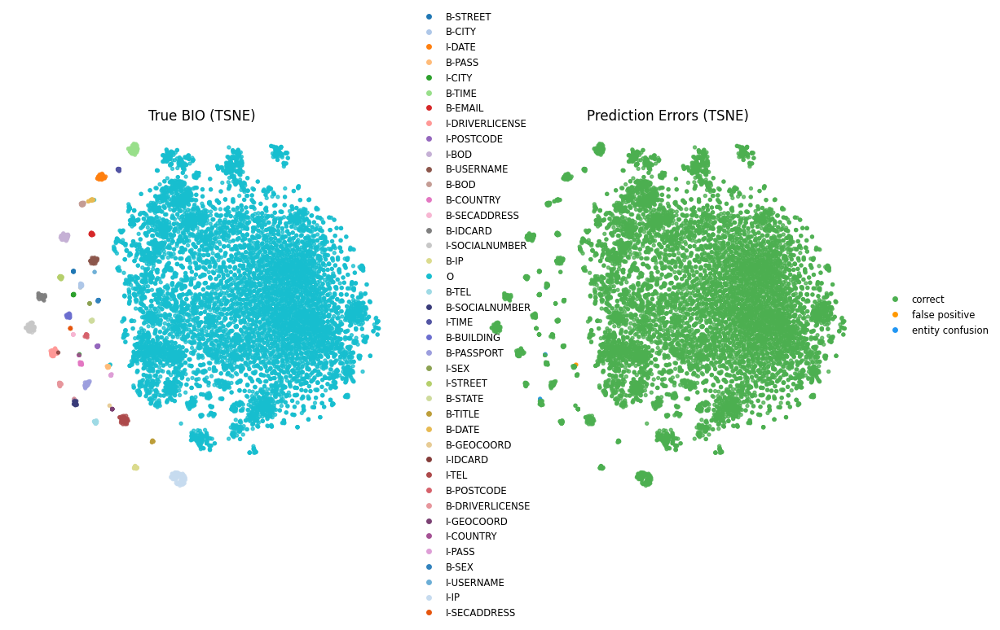

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


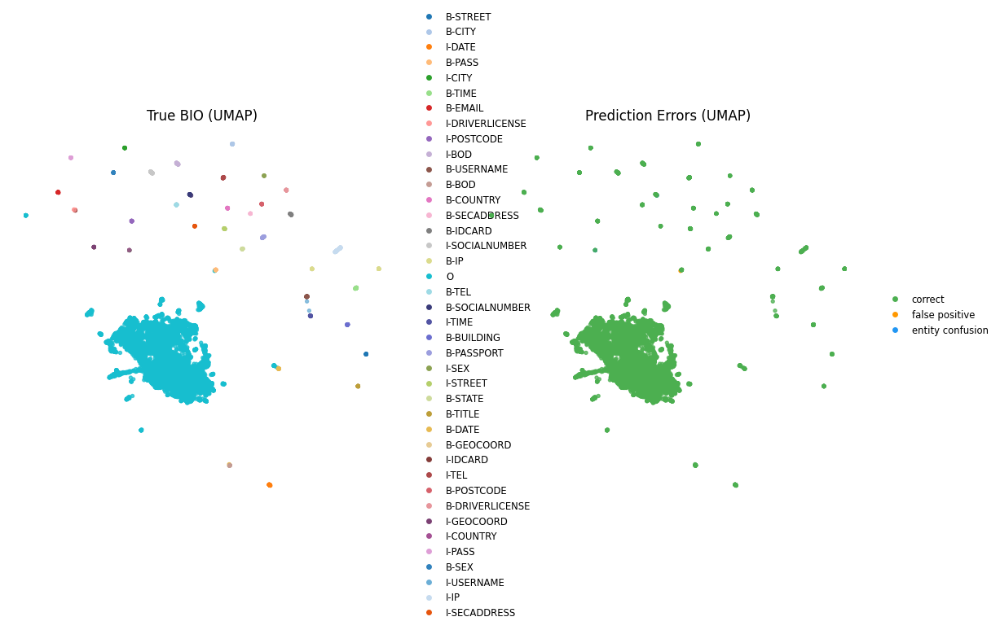

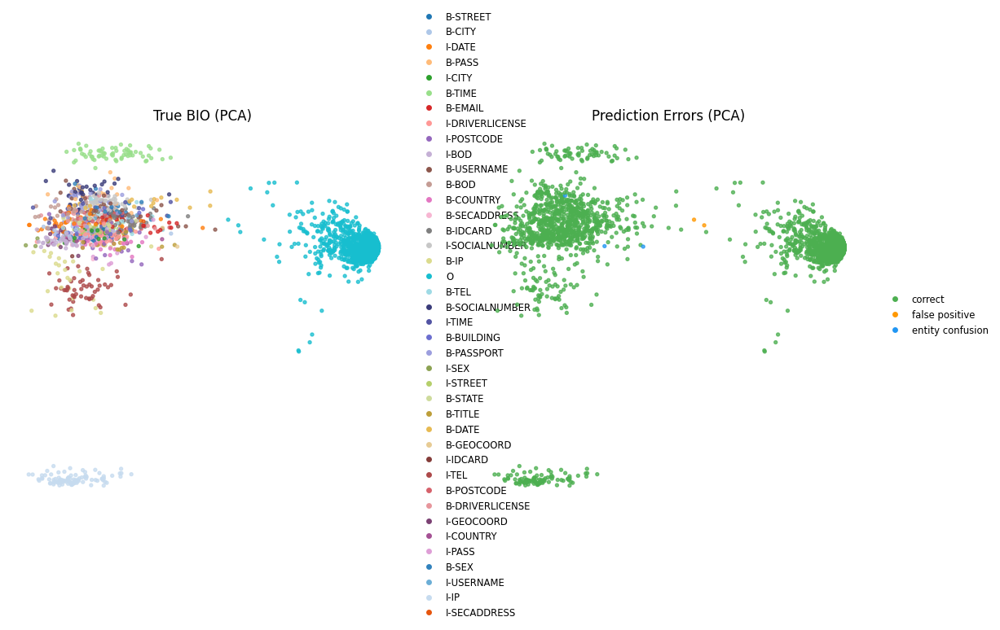

In [43]:
# --- Downsample for TSNE/UMAP ---
if len(train_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(train_all_emb), MAX_POINTS, replace=False)
    train_all_emb = np.array(train_all_emb)[keep]
    train_all_tok = [train_all_tok[i] for i in keep]
    train_flat_gold = [train_flat_gold[i] for i in keep]
    train_flat_pred = [train_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(train_flat_gold, train_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(train_all_emb),
        tokens1=train_all_tok,
        labels1=train_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(train_all_emb),
        tokens2=train_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [44]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report Distilbert1_adv (Train Set Adversarial)\n")
print(classification_report(
    train_flat_gold,
    train_flat_pred,
    target_names=[id2label[i] for i in sorted(set(train_flat_gold + train_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report Distilbert1_adv (Train Set Adversarial)

                 precision    recall  f1-score   support

       B-STREET      1.000     1.000     1.000        16
         B-CITY      0.962     1.000     0.980        25
         I-DATE      1.000     1.000     1.000        45
         B-PASS      0.909     1.000     0.952        20
         I-CITY      1.000     0.950     0.974        20
         B-TIME      1.000     1.000     1.000        65
        B-EMAIL      1.000     1.000     1.000        26
I-DRIVERLICENSE      1.000     1.000     1.000        48
     I-POSTCODE      1.000     1.000     1.000        20
          I-BOD      1.000     1.000     1.000        52
     B-USERNAME      1.000     1.000     1.000        44
          B-BOD      1.000     1.000     1.000        28
      B-COUNTRY      1.000     1.000     1.000        21
   B-SECADDRESS      1.000     1.000     1.000         8
       B-IDCARD      1.000     1.000     1.000        46
 I-SOCIALNUMBER   

### Test Dataset Adversarial

In [45]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb, test_all_tok, test_flat_gold, test_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.distilbert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok.append(tok)
                test_all_emb.append(h[i, j])
                test_flat_gold.append(labels[j])
                test_flat_pred.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


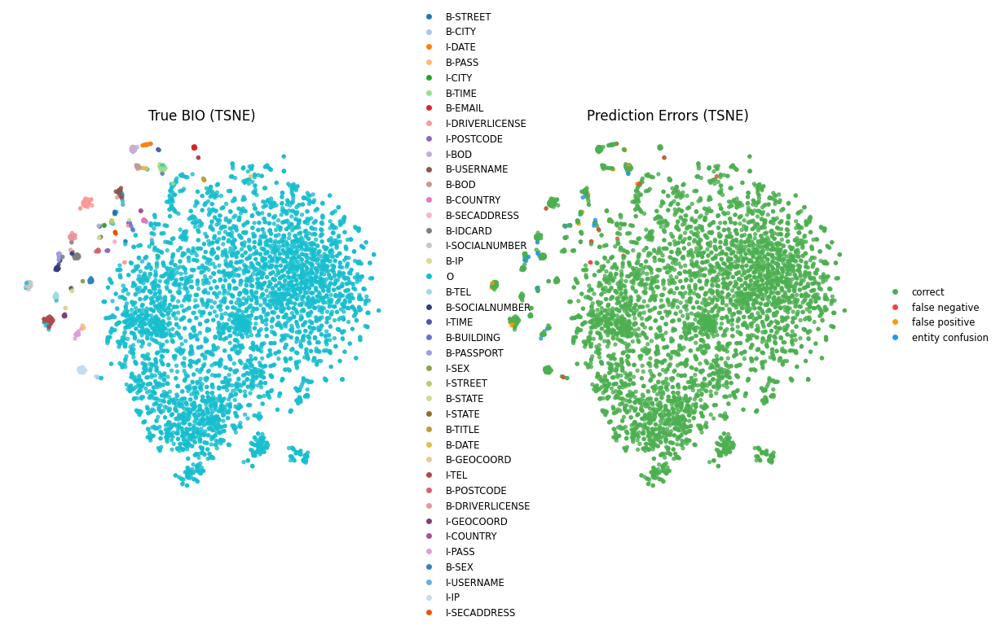

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


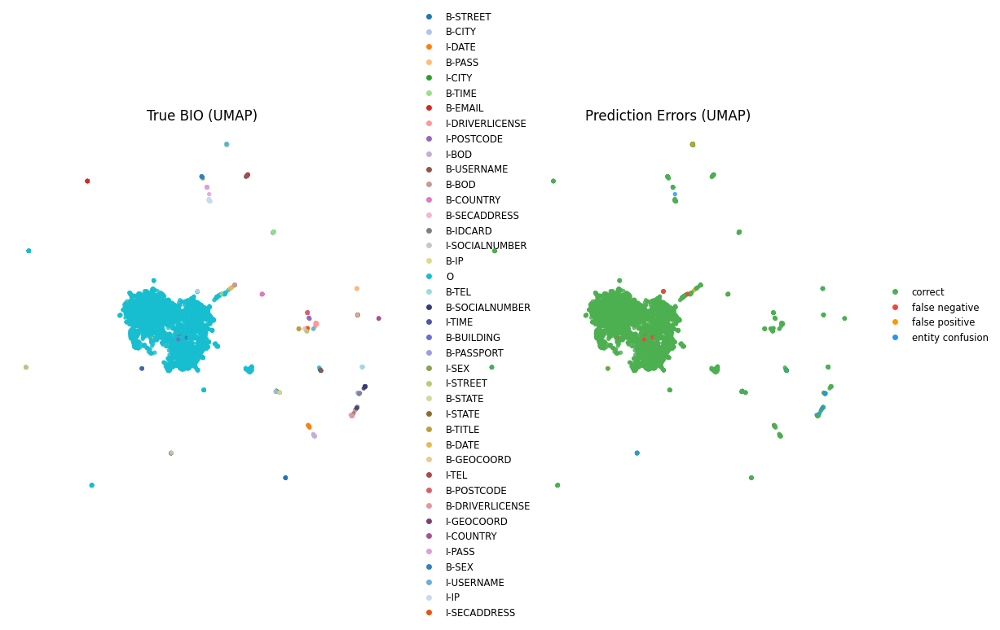

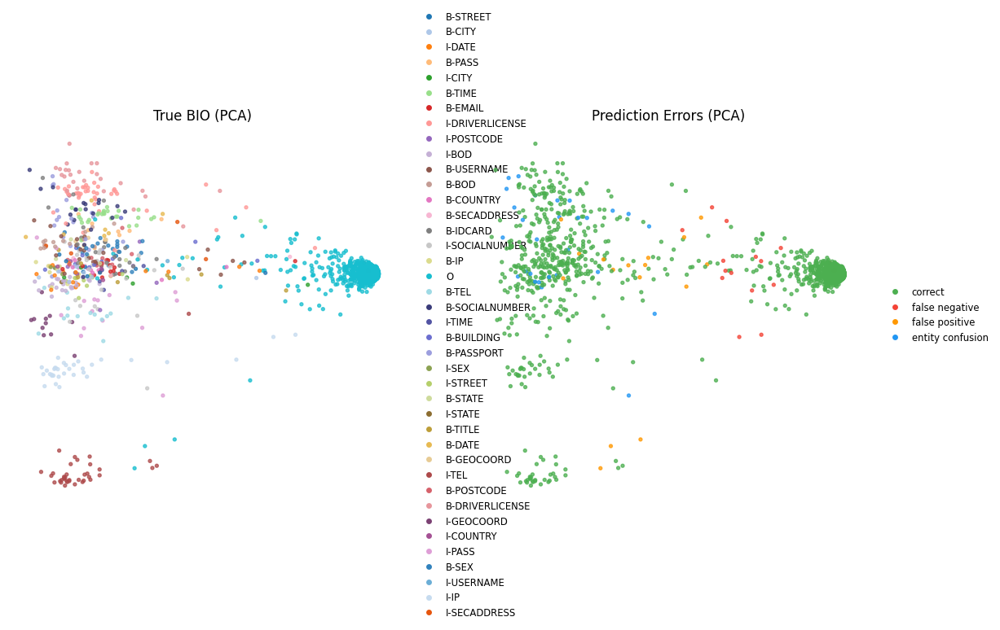

In [46]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb), MAX_POINTS, replace=False)
    test_all_emb = np.array(test_all_emb)[keep]
    test_all_tok = [test_all_tok[i] for i in keep]
    test_flat_gold = [test_flat_gold[i] for i in keep]
    test_flat_pred = [test_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold, test_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb),
        tokens1=test_all_tok,
        labels1=test_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb),
        tokens2=test_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [47]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold,
    test_flat_pred,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold + test_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report (Test Set)

                 precision    recall  f1-score   support

       B-STREET      0.800     0.889     0.842         9
         B-CITY      0.857     0.750     0.800         8
         I-DATE      0.923     0.800     0.857        15
         B-PASS      0.900     1.000     0.947         9
         I-CITY      0.800     0.800     0.800         5
         B-TIME      0.844     0.964     0.900        28
        B-EMAIL      1.000     0.929     0.963        14
I-DRIVERLICENSE      1.000     0.902     0.949        41
     I-POSTCODE      1.000     1.000     1.000         5
          I-BOD      0.923     0.960     0.941        25
     B-USERNAME      0.815     0.957     0.880        23
          B-BOD      1.000     1.000     1.000        15
      B-COUNTRY      0.909     1.000     0.952        10
   B-SECADDRESS      1.000     0.750     0.857         4
       B-IDCARD      0.840     0.840     0.840        25
 I-SOCIALNUMBER      0.897     1.000     0.945 

# Albert 1 Adversarial

C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


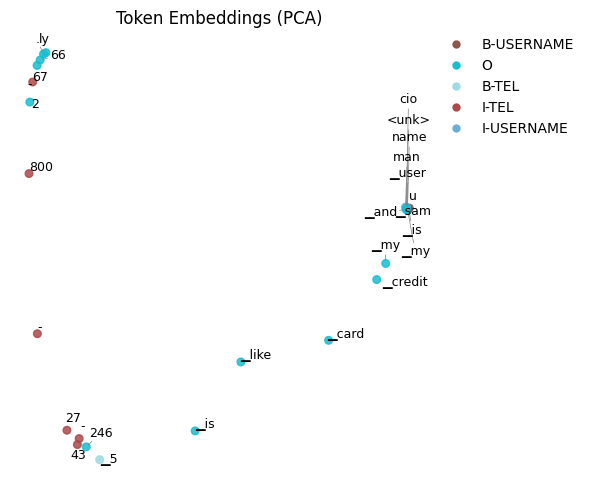

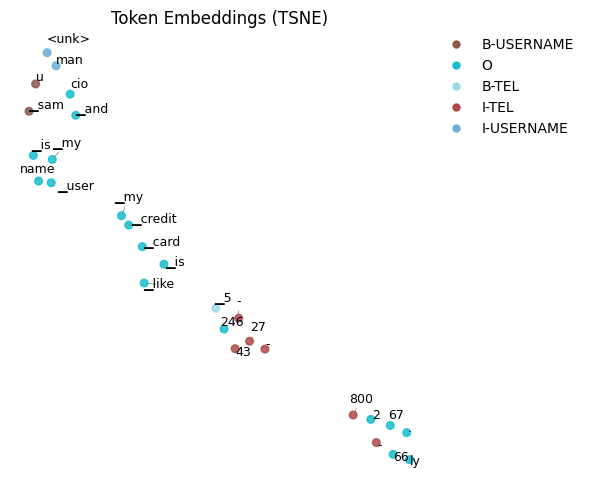

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


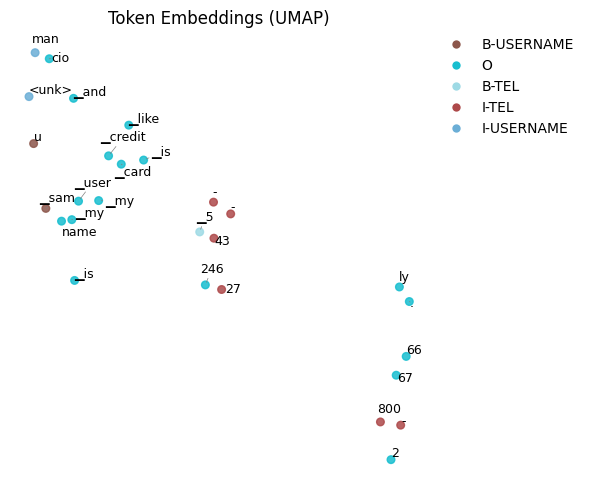

In [48]:
# ---------------------- 1. Extract Token Embeddings (no special tokens) ----------------------
hidden_states, tokens = extract_albert_embeddings(albert1_adv, tokenizer_albert1_adv, test_sentence)

special = {tokenizer_albert1_adv.cls_token, tokenizer_albert1_adv.sep_token, tokenizer_albert1_adv.pad_token}
filtered_tok, filtered_emb = [], []

for i, tok in enumerate(tokens):
    if tok not in special:
        filtered_tok.append(tok)
        filtered_emb.append(hidden_states[i].numpy())  # already on CPU from extract_albert_embeddings

# ---------------------- 2. Predict Labels -----------------------------------------------------
inputs = tokenizer_albert1_adv(test_sentence, return_tensors="pt").to(albert1_adv.device)

with torch.no_grad():
    logits = albert1_adv(**inputs).logits
    preds = logits.argmax(-1).squeeze(0).tolist()

# Align prediction indices with filtered tokens
filtered_lbl = [
    preds[i] for i, tok in enumerate(tokens) if tok not in special
]

# ---------------------- 3. Visualize in 2D ----------------------------------------------------
palette = build_palette(aux.id2label)

for method in ["pca", "tsne", "umap"]:
    visualize_embeddings_2d(
        embeddings     = np.vstack(filtered_emb),
        tokens         = filtered_tok,
        token_labels   = filtered_lbl,
        id2label       = aux.id2label,
        palette        = palette,
        method         = method,
        show_labels    = True,
        use_adjusttext = True,
        legend         = True,
        figsize=(6, 5)
    )


In [49]:
train_json = "data/albert_train_adv.json"        
test_json = "data/albert_test_adv.json"          
train_dataset    = aux.json_to_Dataset_adv(train_json)
test_dataset    = aux.json_to_Dataset_adv(test_json)

model_name = "models/albert1_adv"
model      = AutoModelForTokenClassification.from_pretrained(model_name).to(device).eval()
tokenizer  = AutoTokenizer.from_pretrained(model_name)

print("Train dataset len:", len(train_dataset))
print("Test dataset len:", len(test_dataset))

Train dataset len: 3649
Test dataset len: 962


### Train Dataset Adversarial

In [50]:
# --- Config ---
MAX_POINTS = 10000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
train_all_emb, train_all_tok, train_flat_gold, train_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(train_loader, desc="Train_Embedding + Train_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.albert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                train_all_tok.append(tok)
                train_all_emb.append(h[i, j])
                train_flat_gold.append(labels[j])
                train_flat_pred.append(pred_row[j])

Train_Embedding + Train_Prediction: 100%|██████████| 115/115 [01:51<00:00,  1.03it/s]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


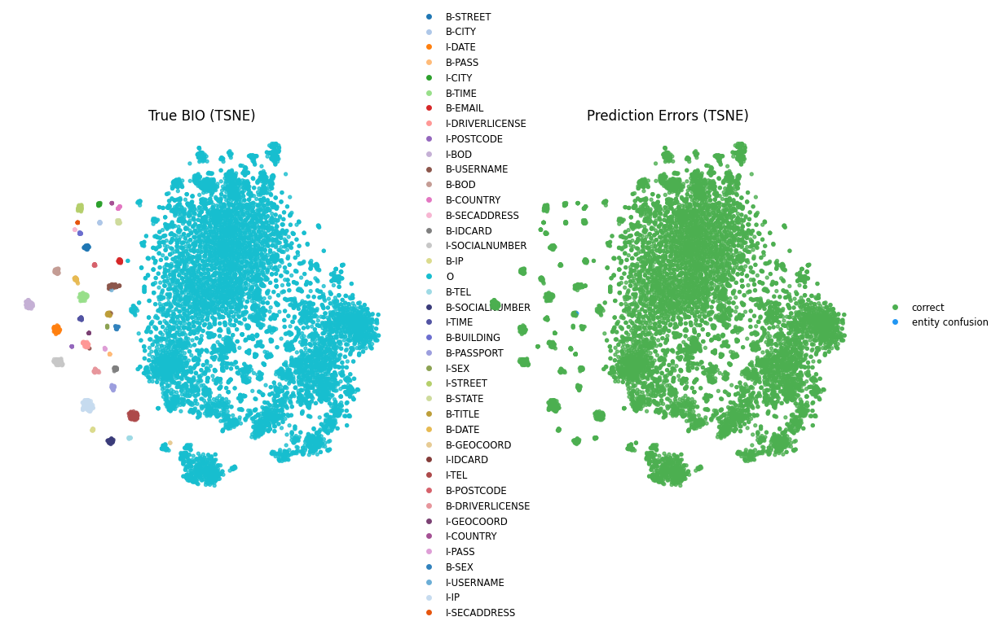

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


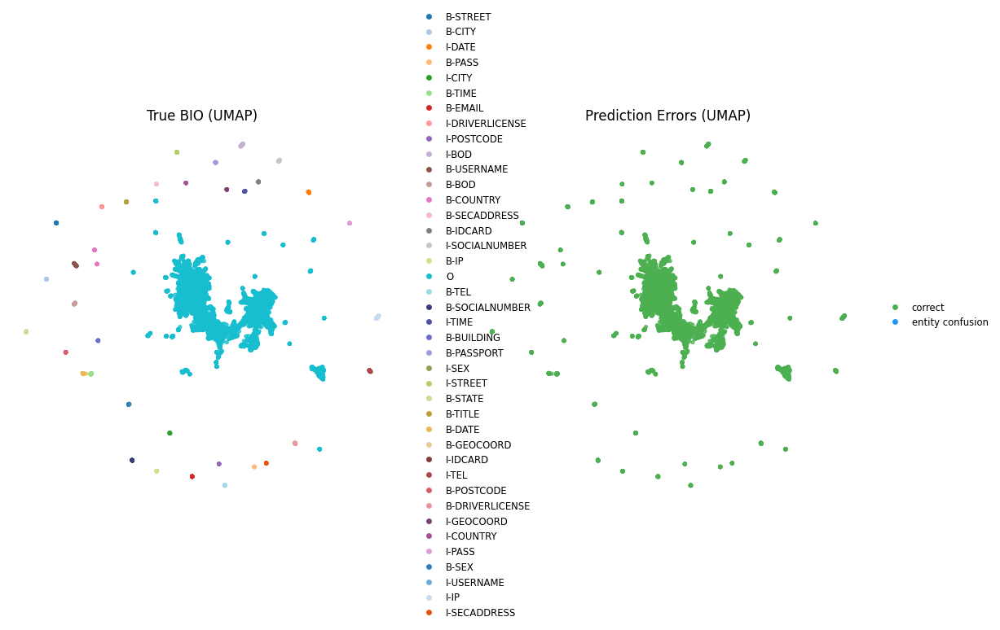

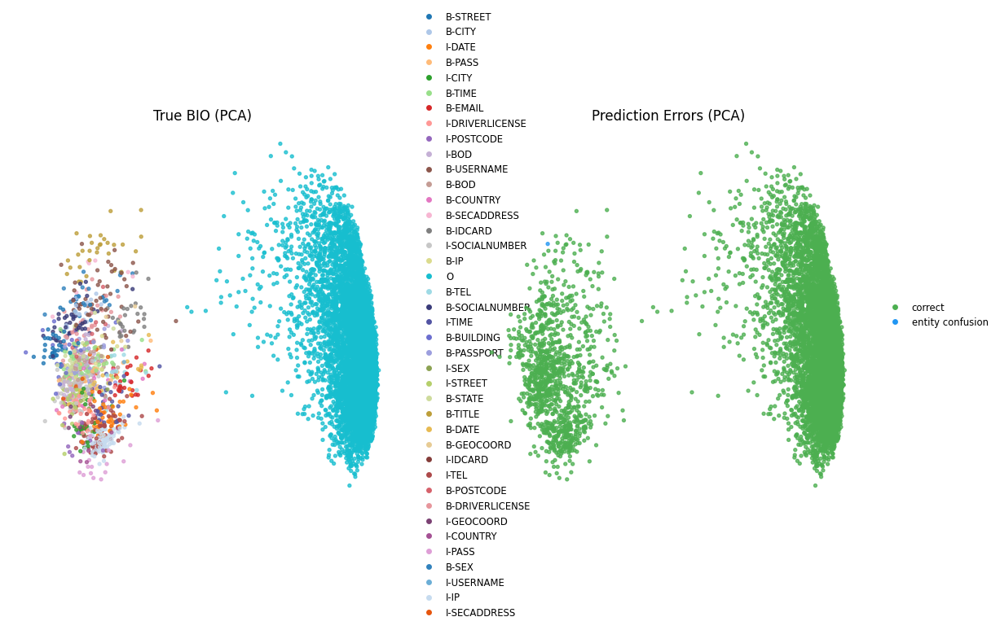

In [51]:
# --- Downsample for TSNE/UMAP ---
if len(train_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(train_all_emb), MAX_POINTS, replace=False)
    train_all_emb = np.array(train_all_emb)[keep]
    train_all_tok = [train_all_tok[i] for i in keep]
    train_flat_gold = [train_flat_gold[i] for i in keep]
    train_flat_pred = [train_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(train_flat_gold, train_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(train_all_emb),
        tokens1=train_all_tok,
        labels1=train_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(train_all_emb),
        tokens2=train_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [52]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Train Set)\n")
print(classification_report(
    train_flat_gold,
    train_flat_pred,
    target_names=[id2label[i] for i in sorted(set(train_flat_gold + train_flat_pred))],
    zero_division=0,
    digits=3
))

Token Classification Report (Train Set)

                 precision    recall  f1-score   support

       B-STREET      1.000     1.000     1.000        37
         B-CITY      1.000     1.000     1.000        20
         I-DATE      1.000     1.000     1.000        50
         B-PASS      1.000     1.000     1.000        14
         I-CITY      1.000     1.000     1.000        25
         B-TIME      1.000     1.000     1.000        55
        B-EMAIL      1.000     1.000     1.000        31
I-DRIVERLICENSE      1.000     1.000     1.000        42
     I-POSTCODE      1.000     1.000     1.000         9
          I-BOD      1.000     1.000     1.000        57
     B-USERNAME      1.000     0.980     0.990        50
          B-BOD      1.000     1.000     1.000        39
      B-COUNTRY      1.000     1.000     1.000        21
   B-SECADDRESS      1.000     1.000     1.000         7
       B-IDCARD      1.000     1.000     1.000        27
 I-SOCIALNUMBER      1.000     1.000     1.000

### Test Dataset Adversarial

In [53]:
# --- Config ---
MAX_POINTS = 5000
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# --- Collator: pads input_ids/attention_mask, keeps tokens + labels ragged ---
def collate_tok_clf(batch):
    numeric = [
        {k: sample[k] for k in ("input_ids", "attention_mask")}
        for sample in batch
    ]
    padded = tokenizer.pad(
        numeric,
        padding="longest",
        return_tensors="pt"
    )
    padded["tokens"] = [sample["tokens"] for sample in batch]
    padded["labels"] = [sample["labels"] for sample in batch]
    return padded

# --- Dataloader ---
test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    collate_fn=collate_tok_clf
)

# --- Embedding + Prediction Pass ---
test_all_emb, test_all_tok, test_flat_gold, test_flat_pred = [], [], [], []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="test_Embedding + test_Prediction"):
        ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)

        # Embeddings
        h = model.albert(input_ids=ids, attention_mask=mask).last_hidden_state
        h = h.cpu().numpy()

        # Predictions
        logits = model(input_ids=ids, attention_mask=mask).logits
        preds = logits.argmax(-1).cpu().tolist()

        # Unpack
        for i, (tokens, labels, pred_row) in enumerate(zip(batch["tokens"], batch["labels"], preds)):
            for j, tok in enumerate(labels):
                if labels[j] == -100:
                    continue
                test_all_tok.append(tok)
                test_all_emb.append(h[i, j])
                test_flat_gold.append(labels[j])
                test_flat_pred.append(pred_row[j])

test_Embedding + test_Prediction: 100%|██████████| 31/31 [00:32<00:00,  1.05s/it]


C:\Users\samue\AppData\Local\Temp\ipykernel_24964\2036773760.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [cm.get_cmap(name, 20) for name in ("tab20", "tab20b", "tab20c")]


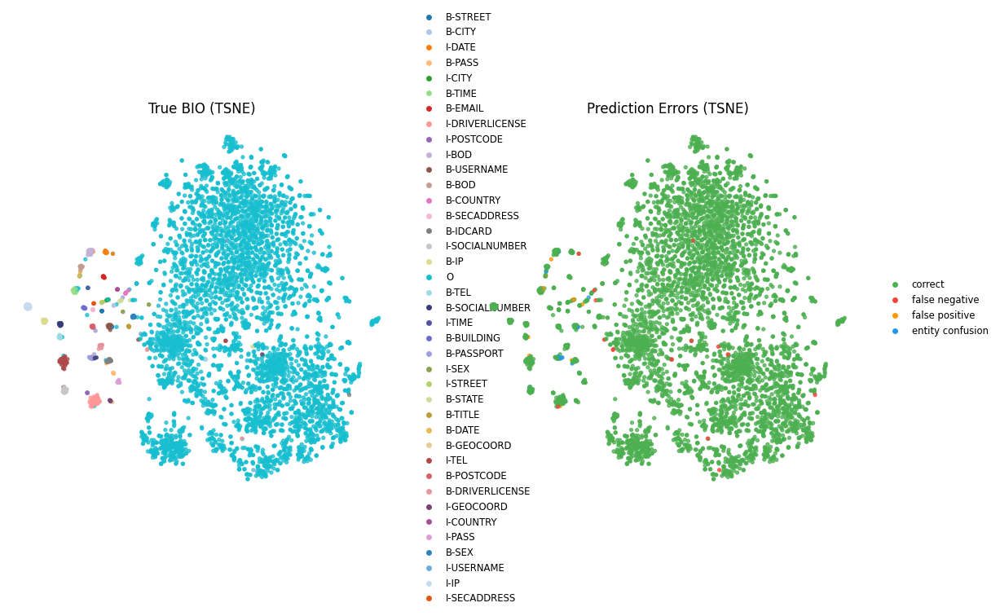

c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\samue\Desktop\nlp-project\cubo_env\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


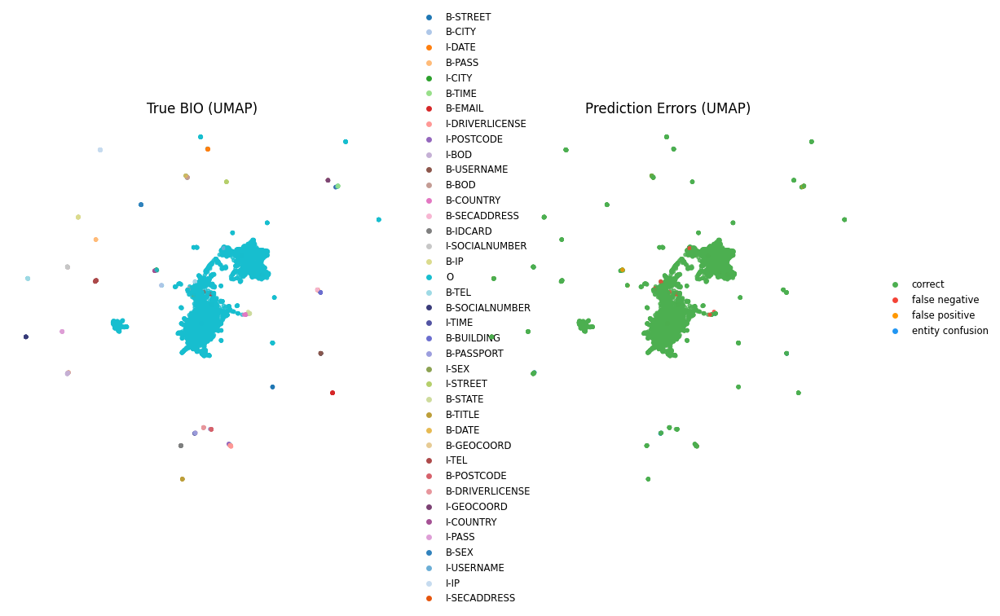

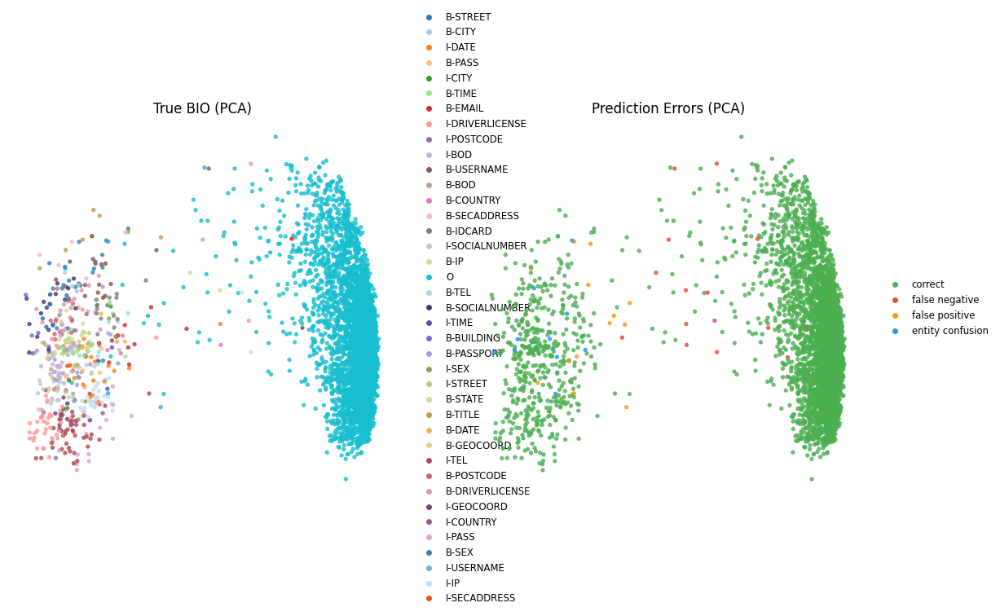

In [54]:
# --- Downsample for TSNE/UMAP ---
if len(test_all_emb) > MAX_POINTS:
    rng = np.random.default_rng(42)
    keep = rng.choice(len(test_all_emb), MAX_POINTS, replace=False)
    test_all_emb = np.array(test_all_emb)[keep]
    test_all_tok = [test_all_tok[i] for i in keep]
    test_flat_gold = [test_flat_gold[i] for i in keep]
    test_flat_pred = [test_flat_pred[i] for i in keep]

# --- Compute error categories ---
label2id = aux.label2id
id2label = aux.id2label
id2label_error = {
    0: "correct",
    1: "false negative",
    2: "false positive",
    3: "entity confusion"
}
custom_palette = {
    0: "#4CAF50",  # green
    1: "#F44336",  # red
    2: "#FF9800",  # orange
    3: "#2196F3"   # blue
}

error_type = []
for g, p in zip(test_flat_gold, test_flat_pred):
    if g == p:
        error_type.append(0)
    elif g != label2id["O"] and p == label2id["O"]:
        error_type.append(1)
    elif g == label2id["O"] and p != label2id["O"]:
        error_type.append(2)
    else:
        error_type.append(3)


# --- Plot all methods side by side ---
palette_bio = build_palette(id2label)
for method in ["tsne", "umap", "pca"]:
    visualize_side_by_side(
        embeddings1=np.vstack(test_all_emb),
        tokens1=test_all_tok,
        labels1=test_flat_gold,
        id2label1=id2label,
        palette1=palette_bio,
        embeddings2=np.vstack(test_all_emb),
        tokens2=test_all_tok,
        labels2=error_type,
        id2label2=id2label_error,
        palette2=custom_palette,
        method=method
    )

In [ ]:
# Classification Report: evaluate token-level predictions (excluding -100 already)
print("Token Classification Report (Test Set)\n")
print(classification_report(
    test_flat_gold,
    test_flat_pred,
    target_names=[id2label[i] for i in sorted(set(test_flat_gold + test_flat_pred))],
    zero_division=0,
    digits=3
))